# Plots for section 4 systems

In [1]:
# TODO
# Storage plot: how long is a unit of energy stored on average for all storage technologies
# Share of annual output per storage technology

## Imports

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import pypsa
import math
import seaborn as sns
import cartopy
import cartopy.crs as ccrs
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from shapely.geometry import Point, LineString
from datetime import datetime
import matplotlib.patheffects as pe

# imported own functions
from utils import market_values, market_values_by_time_index, nodal_balance, capacity, capacity_links, capacity_storage_units, get_condense_sum, nodal_balance, generation, generation_links, generation_storage_units, market_values_storage_units, market_values_links

# imported own definitions
from utils import carrier_colors, carrier_renaming, carrier_renaming_reverse, resistive_heater, gas_boiler, heat_pump, water_tanks_charger, water_tanks_discharger, solar_thermal

# general variables
font1 = {'fontname':'Calibri'}
PLOT_DIR = 'C:/Users/Julian/Studies/Master/01 TU Berlin/3. Semester - Masterarbeit/MA Marktwerte FEE/data/plots/'
onshore_regions = gpd.read_file("../data/external/regions_onshore_elec_s_181.geojson")
offshore_regions = gpd.read_file("../data/external/regions_offshore_elec_s_181.geojson")
onshore_regions = onshore_regions.set_index('name')
offshore_regions = offshore_regions.set_index('name')

In [3]:
# Network imports
n_no =pypsa.Network("../data/raw/elec_s_181_lv1.0__Co2L0-3H-T-H-B-I-A-solar+p3-linemaxext10-noH2network_2030.nc")
n_h2 =pypsa.Network("../data/raw/elec_s_181_lvopt__Co2L0-3H-T-H-B-I-A-solar+p3-linemaxext10_2030.nc")

Importing PyPSA from older version of PyPSA than current version.
Please read the release notes at https://pypsa.readthedocs.io/en/latest/release_notes.html
carefully to prepare your network for import.
Currently used PyPSA version [0, 20, 1], imported network file PyPSA version [0, 18, 1].

INFO:pypsa.io:Imported network elec_s_181_lv1.0__Co2L0-3H-T-H-B-I-A-solar+p3-linemaxext10-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
Importing PyPSA from older version of PyPSA than current version.
Please read the release notes at https://pypsa.readthedocs.io/en/latest/release_notes.html
carefully to prepare your network for import.
Currently used PyPSA version [0, 20, 1], imported network file PyPSA version [0, 18, 1].

INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0-3H-T-H-B-I-A-solar+p3-linemaxext10_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [4]:
# Notebook Definitions
c1_groups = [resistive_heater, gas_boiler, heat_pump, water_tanks_charger, water_tanks_discharger, solar_thermal]
c1_groups_name = ["resistive heater", "gas boiler", "heat pump", "water tanks charger", "water tanks discharger", "solar thermal"]
markers =["v", "^", "<", ">", "1", "2", "3", "4", "*", "+", "d", "o", "|", "s", "P", "p", "h"]

In [5]:
# Notebook Functions

def get_df(df_no, df_h2, carriers):
    result = pd.DataFrame(index = ["STST", "EXP"])

    for c in carriers:
        result.loc["STST" , c] = df_no[c].values
        result.loc["EXP" , c] = df_h2[c].values
    return result

def c_gen(carrier_list, network):
    result = []
    for c in carrier_list:
        if c in network.generators.carrier.unique().tolist():
            result.append(c)
    return result

def c_link(carrier_list, network):
    result = []
    for c in carrier_list:
        if c in network.links.carrier.unique().tolist():
            result.append(c)
    return result

def c_su(carrier_list, network):
    result = []
    for c in carrier_list:
        if c in network.storage_units.carrier.unique().tolist():
            result.append(c)
    return result

In [6]:
# Regions

onshore_regions['coords'] = onshore_regions['geometry'].apply(lambda x: x.representative_point().coords[:])
onshore_regions['coords'] = [coords[0] for coords in onshore_regions['coords']]
onshore_regions["name"] = onshore_regions.index
offshore_regions['coords'] = offshore_regions['geometry'].apply(lambda x: x.representative_point().coords[:])
offshore_regions['coords'] = [coords[0] for coords in offshore_regions['coords']]
offshore_regions["name"] = offshore_regions.index

## CALC

In [7]:
# calc market values, generation, lmps, capacity factors for generators, links and storage units

for n in [n_no, n_h2]:
    df_regions_onshore = onshore_regions.copy()
    df_regions_offshore = offshore_regions.copy()

    # function for carriers in n.generators.carrier.unique() #13
    for carrier in n.generators.carrier.unique():
        df_regions_onshore[f"{carrier}_mv"] = market_values(n, carrier)
        df_regions_offshore[f"{carrier}_mv"] = market_values(n, carrier)
        # generation in TWh
        df_regions_onshore[f"{carrier}_gen"] = generation(n, carrier) / 1000
        df_regions_offshore[f"{carrier}_gen"] = generation(n, carrier) / 1000
        # lmps
        # capacity factors
        df_regions_onshore[f"{carrier}_cf"] = generation(n, carrier) / (capacity(n, carrier) *2920)
        df_regions_offshore[f"{carrier}_cf"] = generation(n, carrier) / (capacity(n, carrier) *2920)


    # function for carriers in n.links.carrier.unique() #53
    for carrier in n.links.carrier.unique():
        df_regions_onshore[f"{carrier}_mv"] = market_values_links(n, carrier)
        df_regions_onshore[f"{carrier}_gen"] = generation_links(n, carrier) / 1000
        df_regions_onshore[f"{carrier}_cf"] = generation_links(n, carrier) / (capacity_links(n, carrier) *2920)

    # function for carriers in n.storage_units.carrier.unique() #2
    for carrier in n.storage_units.carrier.unique():
        df_regions_onshore[f"{carrier}_mv"] = market_values_storage_units(n, carrier)
        df_regions_onshore[f"{carrier}_gen"] = generation_storage_units(n, carrier) / 1000
        # capacity factors (both generation and consumption(loading) is considered
        gen = abs(n.storage_units_t.p.loc[:, n.storage_units.carrier == carrier])
        gen.columns = gen.columns.map(n.storage_units.bus)
        gen.columns = gen.columns.map(n.buses.location)
        df_regions_onshore[f"{carrier}_cf"] = gen.sum() / (capacity_storage_units(n, carrier) *2920)

    # set market values to nan where generation in corresponding region is lower than % quantile
    qt = 0.2
    for carrier in (n.generators.carrier.unique().tolist() +
                    n.links.carrier.unique().tolist() +
                    n.storage_units.carrier.unique().tolist()):
        index = df_regions_onshore[f"{carrier}_gen"] <= np.quantile(df_regions_onshore[f"{carrier}_gen"], qt)
        df_regions_onshore[f"{carrier}_mv"][index] = np.nan

    # calc lmps at the buses (lmps that are only present for EU (e.g. oil) are nan at the moment)
    # TODO: decide if EU lmps are used as lmp for all regions
    for carrier_bus in n.buses.carrier.unique():
        # index would be same names as the bus (not the location as it is in the index of
        # df_regions_onshore so far -> map location to make sure the right lmp is set
        locs = n.buses.location[n.buses[n.buses.carrier == carrier_bus].index]
        lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier == carrier_bus].index].mean()
        df = pd.concat([lmps, locs], axis=1).rename(columns={0: f"{carrier_bus}_lmp"})
        df.set_index("location", inplace=True)
        if df.size == 1:
            if df.index == "EU":
                df = pd.DataFrame(np.repeat(df.values, 181), index=df_regions_onshore.index, columns=[f"{carrier_bus}_lmp"])
                df_regions_onshore[f"{carrier_bus}_lmp"] = df[f"{carrier_bus}_lmp"]
        else:
            df_regions_onshore[f"{carrier_bus}_lmp"] = df[f"{carrier_bus}_lmp"]

    if n == n_no:
        df_no_ons = df_regions_onshore
        df_no_off = df_regions_offshore

    if n == n_h2:
        df_h2_ons = df_regions_onshore
        df_h2_off = df_regions_offshore

df_no_ons.head()

,geometry,coords,name,offwind-ac_mv,offwind-ac_gen,offwind-ac_cf,onwind_mv,onwind_gen,onwind_cf,solar_mv,...,urban central water tanks_lmp,biogas_lmp,solid biomass_lmp,solid biomass for industry_lmp,gas for industry_lmp,H2 liquid_lmp,oil_lmp,process emissions_lmp,low voltage_lmp,home battery_lmp
name,,,,,,,,,,,,,,,,,,,,,
AL0 0,"POLYGON ((20.32207 39.91318, 20.39703 39.81809...","(20.00648437943388, 41.14563914300007)",AL0 0,126.148417,0.009746,0.090705,NaN,0.005042,0.038018,44.628736,...,43.532557,113.716896,102.453861,78.924392,113.135704,137.617875,50.009981,-408.520212,100.338046,100.380697
AT0 0,"POLYGON ((16.45660 47.41184, 16.43396 47.39685...","(15.700718667666258, 47.896990619088925)",AT0 0,NaN,NaN,NaN,83.457109,10131.968084,0.149667,54.679083,...,55.231280,113.716896,102.453861,78.924392,113.135704,151.448316,50.009981,-408.520212,115.006246,115.044440
AT0 1,"POLYGON ((10.08288 47.35907, 10.20928 47.37248...","(10.379200993764837, 47.18231496200006)",AT0 1,NaN,NaN,NaN,NaN,0.000116,0.004685,65.745903,...,55.553668,113.716896,102.453861,78.924392,113.135704,154.026970,50.009981,-408.520212,121.910720,121.947576
AT0 2,"POLYGON ((13.47802 46.56357, 13.23111 46.55217...","(13.805469952867842, 47.57283376100011)",AT0 2,NaN,NaN,NaN,NaN,0.004773,0.039178,58.223787,...,58.936874,113.716896,102.453861,78.924392,113.135704,148.663198,50.009981,-408.520212,112.352878,112.386673
BA0 0,"POLYGON ((17.82716 42.85312, 17.81176 42.90986...","(17.97055162265331, 43.88773569750005)",BA0 0,NaN,NaN,NaN,NaN,0.004686,0.031802,51.160537,...,51.074197,113.716896,102.453861,78.924392,113.135704,147.689672,50.009981,-408.520212,112.040690,112.006725


In [8]:
# calc market values, generation, lmps, capacity factors for generators, links and storage units
df_regions_onshore = onshore_regions.copy()
df_regions_offshore = offshore_regions.copy()
n = n_h2

# function for carriers in n.generators.carrier.unique() #13
for carrier in n.generators.carrier.unique():
    df_regions_onshore[f"{carrier}_mv"] = market_values(n, carrier)
    df_regions_offshore[f"{carrier}_mv"] = market_values(n, carrier)
    # generation in TWh
    df_regions_onshore[f"{carrier}_gen"] = generation(n, carrier) / 1000
    df_regions_offshore[f"{carrier}_gen"] = generation(n, carrier) / 1000
    # lmps
    df_regions_onshore[f"{carrier}_gen"] = generation(n, carrier) / 1000
    df_regions_offshore[f"{carrier}_gen"] = generation(n, carrier) / 1000

# function for carriers in n.links.carrier.unique() #53
for carrier in n.links.carrier.unique():
    df_regions_onshore[f"{carrier}_mv"] = market_values_links(n, carrier)
    df_regions_onshore[f"{carrier}_gen"] = generation_links(n, carrier) / 1000

# function for carriers in n.storage_units.carrier.unique() #2
for carrier in n.storage_units.carrier.unique():
    df_regions_onshore[f"{carrier}_mv"] = market_values_storage_units(n, carrier)
    df_regions_onshore[f"{carrier}_gen"] = generation_storage_units(n, carrier) / 1000

# set market values to nan where generation in corresponding region is lower than % quantile
qt = 0.2
for carrier in (n.generators.carrier.unique().tolist() +
                n.links.carrier.unique().tolist() +
                n.storage_units.carrier.unique().tolist()):
    index = df_regions_onshore[f"{carrier}_gen"] <= np.quantile(df_regions_onshore[f"{carrier}_gen"], qt)
    df_regions_onshore[f"{carrier}_mv"][index] = np.nan

# calc lmps at the buses (lmps that are only present for EU (e.g. oil) are nan at the moment)
# TODO: decide if EU lmps are used as lmp for all regions
for carrier_bus in n.buses.carrier.unique():
    # index would be same names as the bus (not the location as it is in the index of
    # df_regions_onshore so far -> map location to make sure the right lmp is set
    locs = n.buses.location[n.buses[n.buses.carrier == carrier_bus].index]
    lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier == carrier_bus].index].mean()
    df = pd.concat([lmps, locs], axis=1).rename(columns={0: f"{carrier_bus}_lmp"})
    df.set_index("location", inplace=True)
    if df.size == 1:
        if df.index == "EU":
            df = pd.DataFrame(np.repeat(df.values, 181), index=df_regions_onshore.index, columns=[f"{carrier_bus}_lmp"])
            df_regions_onshore[f"{carrier_bus}_lmp"] = df[f"{carrier_bus}_lmp"]
    else:
        df_regions_onshore[f"{carrier_bus}_lmp"] = df[f"{carrier_bus}_lmp"]

df_regions_onshore.head(3)
# df_regions_offshore.head(3)

df_h2_ons = df_regions_onshore
df_h2_off = df_regions_offshore

In [9]:
assert 0

AssertionError: 

# 4.1 Overview

## Network Overview

### Electricity network

In [ ]:
m_no = n_no.copy()
m_no.mremove("Bus",m_no.buses[m_no.buses.x == 0].index )

m_h2 = n_h2.copy()
m_h2.mremove("Bus",m_h2.buses[m_h2.buses.x == 0].index )

In [ ]:
fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 6))

bus_locs = pd.Index(m_no.buses.location.unique())
load_distribution = m_no.loads_t.p[bus_locs].sum()/m_no.loads_t.p[bus_locs].sum().max()

m_no.plot(bus_sizes=1*load_distribution, ax=ax, projection=ccrs.EqualEarth())
ax.set_title("Load distribution", pad=20)
plt.show()
# same for m_h2

In [ ]:
fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 6))

m_no.plot(ax=ax, projection=ccrs.EqualEarth(), bus_colors="black", line_colors="gold", link_colors="deepskyblue", line_widths=0.8, link_widths=1)
pypsa.plot.add_legend_patches(ax=ax, labels=["HVAC lines", "HVDC lines"], colors=["gold","deepskyblue"], legend_kw={'loc': 'upper left'})
plt.show()

In [ ]:
# AC lines

In [ ]:
# all AC network lines are froms same type
n_no.lines.type.unique()

In [ ]:
# Optimised capacity for apparent power: capacities in megavolt amperes (MVA)
n_h2.lines.s_nom_opt.sum()
n_no.lines.s_nom_opt.sum()

In [ ]:
# sum of all capacities of all AC lines is almost twice as high for the second network
n_h2.lines.s_nom_opt.sum() / n_no.lines.s_nom_opt.sum()

In [ ]:
# DC cables

In [ ]:
n_no.links[n_no.links.carrier == "DC"].p_nom_opt.sum()

In [ ]:
n_h2.links[n_h2.links.carrier == "DC"].p_nom_opt.sum()

In [ ]:
n_h2.links[n_h2.links.carrier == "DC"].p_nom_opt.sum() / n_no.links[n_no.links.carrier == "DC"].p_nom_opt.sum()

In [ ]:
# overall length of network

In [ ]:
# AC lines (km)
n_no.lines.length.sum()

In [ ]:
# DC lines (km)
n_no.links[n_no.links.carrier == "DC"].length.sum()

In [ ]:
# AC lines (km)
n_h2.lines.length.sum()

In [ ]:
n_h2.links[n_h2.links.carrier == "DC"].length.sum()

Findings:
- electricity network has the same lines in both scenarios, difference is in the capacity
- the lines (AC, DC) also have the same length
- The capacity of the AC lines are twice as high in the h2 case
- The capacity of the DC lines are 11 times higher than in the no case

### Hydrogen network

In [ ]:
l_h2 = n_h2.copy()

locs = l_h2.buses[l_h2.buses.carrier == "AC"][["x","y"]]
mapping = pd.DataFrame(l_h2.buses[l_h2.buses.carrier == "H2"].location)
mapping["bus"] = mapping.index
mapping.set_index("location", inplace =True)
locs.index = locs.index.map(mapping.to_dict()['bus'])
l_h2.buses.x[l_h2.buses.carrier == "H2"] = locs.x
l_h2.buses.y[l_h2.buses.carrier == "H2"] = locs.y

l_h2.mremove("Bus",l_h2.buses[l_h2.buses.carrier != "H2"].index)

# write LineStrign into pipes (links)
h2_pipes = l_h2.links[l_h2.links.carrier.isin(["H2 pipeline retrofitted" , "H2 pipeline"])].index
other_links = l_h2.links[-l_h2.links.carrier.isin(["H2 pipeline retrofitted" , "H2 pipeline"])].index

for pipe in h2_pipes:
    loc1 = l_h2.buses.loc[l_h2.links.loc[pipe].bus0][["x", "y"]]
    loc2 = l_h2.buses.loc[l_h2.links.loc[pipe].bus1][["x", "y"]]
    l_h2.links.geometry.loc[pipe] = LineString([Point(loc1), Point(loc2)]).wkt

l_h2.mremove("Link", other_links)
l_h2.mremove("Line", l_h2.lines.index)

In [ ]:
fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 6))

l_h2.plot(ax=ax, link_colors="pink", link_widths=0.8,  projection=ccrs.EqualEarth())
pypsa.plot.add_legend_patches(ax=ax, labels=["hydrogen pipes"], colors=["pink"], legend_kw={'loc': 'upper left'})
ax.set_title("H2 network", pad=20)
plt.show()

In [ ]:
# adding colorbar to this

fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 6))

l_h2.links.p_max_pu
l_h2.plot(ax=ax, link_colors=l_h2.links.p_nom_opt, link_cmap=plt.get_cmap("magma_r"), link_widths=np.log10(l_h2.links.p_nom_opt),  projection=ccrs.EqualEarth())
ax.set_title("H2 network", pad=20)
plt.show()

In [ ]:
# hydrogen pipeline network in km
n_h2.links[n_h2.links.carrier.isin(["H2 pipeline retrofitted" , "H2 pipeline"])].length.sum()

In [ ]:
n_h2.links[n_h2.links.carrier.isin(["H2 pipeline retrofitted" , "H2 pipeline"])]

## Installed Capacity, Generation, Consumption

In [ ]:
cap_no = pd.DataFrame(index=n_no.buses.location.unique())
cap_h2 = pd.DataFrame(index=n_h2.buses.location.unique())

for n, df in zip([n_no, n_h2], [cap_no,cap_h2]):

    for c in n.generators.carrier.unique():
        # capacity in GW
        df[c] = capacity(n, c) / 1000

    for c in n.links.carrier.unique():
        # capacity in GW
        df[c] = capacity_links(n, c) / 1000

    for c in n.storage_units.carrier.unique():
        # capacity in GW
        df[c] = capacity_storage_units(n, c) / 1000

# condense groups
cap_no = get_condense_sum(cap_no, c1_groups, c1_groups_name)
cap_h2 = get_condense_sum(cap_h2, c1_groups, c1_groups_name)
# rename unhandy column names
cap_no.rename(columns=carrier_renaming, inplace=True)
cap_h2.rename(columns=carrier_renaming, inplace=True)

In [ ]:
cap_no_sum = pd.DataFrame(cap_no.sum().sort_values(ascending=False)).transpose()
sns.set(rc={'figure.figsize': (20, 5)})
sns.barplot(data=cap_no_sum.iloc[: , 1:40])
ticks = plt.xticks(rotation=90)
plt.show()

In [ ]:
cap_h2_sum = pd.DataFrame(cap_h2.sum().sort_values(ascending=False)).transpose()
sns.set(rc={'figure.figsize': (20, 5)})
sns.barplot(data=cap_h2_sum.iloc[: , 1:40])
ticks = plt.xticks(rotation=90)
plt.show()

In [ ]:
# thesis_plot
# capacity of important technologies

fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(12, 6))
bbox = (0.5, 1.25)

carriers = ["solar" , "solar rooftop"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax0, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax0.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["onwind", "offwind-dc", "offwind-ac"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax1.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["H2 Electrolysis", "SMR", "SMR CC"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax2.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["Fischer-Tropsch", "Sabatier", "H2 liquefaction"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax3, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax3.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["battery charger", "battery discharger"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax4, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax4.legend(loc='upper center', bbox_to_anchor=bbox)

fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/capa_scenarios.png")

In [ ]:
carriers = ["hydro"]
get_df(cap_no_sum, cap_h2_sum, carriers)

In [ ]:
# magnitude is in GW
carriers = ["battery charger", "battery discharger"]
round(get_df(cap_no_sum, cap_h2_sum, carriers), 0).transpose() / round(get_df(cap_no_sum, cap_h2_sum, carriers), 0).transpose().sum()
# round(get_df(cap_no_sum, cap_h2_sum, carriers), 0).sum(axis=1)

In [ ]:
# magnitude is in GW
carriers = ["H2 Fuel Cell"]
round(get_df(cap_no_sum, cap_h2_sum, carriers), 0).transpose()
# round(get_df(cap_no_sum, cap_h2_sum, carriers), 0).sum(axis=1)


Notes:
- 'H2 pipeline', 'H2 pipeline retrofitted' are the only difference in the carriers (n_no does not have them)
- H2 Fuel Cell Capacity is not really existent: capacity without H2 network is 1 GW and with H2 network it is 0


In [ ]:
# capacity of peak power plants

fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(12, 6))
bbox = (0.5, 1.25)

carriers = ["gas CHP CC", "gas CHP"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax0, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax0.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["hydro", "PHS"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax1.legend(loc='upper center', bbox_to_anchor=bbox)


carriers = ["biomass CHP CC" , "biomass CHP"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax2.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["OCGT"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax3, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax3.legend(loc='upper center', bbox_to_anchor=bbox)

carriers = ["V2G"]
get_df(cap_no_sum, cap_h2_sum, carriers).plot(ax = ax4, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in carriers], ylabel="Capacity [GW]")
ax4.legend(loc='upper center', bbox_to_anchor=bbox)

fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/capa_peak_scenarios.png")

In [ ]:
# thesis_plot:

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 11))

for n in [n_no, n_h2]:

    carrier = ["AC", "low voltage"]
    nb = nodal_balance(n, carrier=carrier, time="2013", aggregate=['component', 'bus'], energy=True)
    # convert from MW to GW
    nb = nb.unstack(level=[1]) / 1000
    # condense condense_groups
    nb = get_condense_sum(nb, c1_groups, c1_groups_name)
    # rename unhandy column names
    nb.rename(columns=carrier_renaming, inplace=True)

    nb_pos = nb[nb > 0].sum().sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_pos = nb_pos[(nb_pos / nb_pos.sum()) > 0.01]

    nb_neg = abs(nb[nb < 0].sum()).sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_neg = nb_neg[(nb_neg / nb_neg.sum()) > 0.01]

    if n==n_no:
        ax_gen=axs[0, 0]
        ax_con=axs[0, 1]
        title_gen=f"Electricity generation (STST)"
        title_con=f"Electricity consumption (STST)"

    elif n==n_h2:
        ax_gen=axs[1, 0]
        ax_con=axs[1, 1]
        title_gen=f"Electricity generation (EXP)"
        title_con=f"Electricity consumption (EXP)"

    # generation
    c = [carrier_colors[col] for col in nb_pos.index]
    percents = nb_pos.to_numpy() * 100 / nb_pos.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_pos.index, percents)]

    patches, texts = ax_gen.pie(nb_pos, colors=c, startangle=0, labels=labels)
    ax_gen.axis('equal')
    ax_gen.set_title(title_gen, pad=20, fontweight="bold")

    # consumption
    c = [carrier_colors[col] for col in nb_neg.index]
    percents = nb_neg.to_numpy() * 100 / nb_neg.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_neg.index, percents)]

    patches, texts = ax_con.pie(nb_neg, colors=c, startangle=0, labels=labels)
    ax_con.axis('equal')

    ax_con.set_title(title_con, pad=20, fontweight="bold")

fig.tight_layout(pad=5)
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/gen_con_ac_lowvoltage.png")

In [ ]:
nb[nb > 0].sum().sort_values(ascending=False) / nb[nb > 0].sum().sort_values(ascending=False).sum()

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 11))

for n in [n_no, n_h2]:

    carrier = ["H2"]
    nb = nodal_balance(n, carrier=carrier, time="2013", aggregate=['component', 'bus'], energy=True)
    # convert from MW to GW
    nb = nb.unstack(level=[1]) / 1000

    nb_pos = nb.sum()[nb.sum() > 0].sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_pos = nb_pos[(nb_pos / nb_pos.sum()) > 0.01]

    nb_neg = abs(nb.sum()[nb.sum() < 0]).sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_neg = nb_neg[(nb_neg / nb_neg.sum()) > 0.01]

    if n==n_no:
        ax_gen=axs[0, 0]
        ax_con=axs[0, 1]
        title_gen=f"Generation: {carrier} (no H2 network)"
        title_con=f"Consumption: {carrier} (no H2 network)"

    elif n==n_h2:
        ax_gen=axs[1, 0]
        ax_con=axs[1, 1]
        title_gen=f"Generation: {carrier} (with H2 network)"
        title_con=f"Consumption: {carrier} (with H2 network)"

    # generation
    c = [carrier_colors[col] for col in nb_pos.index]
    percents = nb_pos.to_numpy() * 100 / nb_pos.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_pos.index, percents)]

    patches, texts = ax_gen.pie(nb_pos, colors=c, startangle=0, labels=labels)
    ax_gen.axis('equal')
    ax_gen.set_title(title_gen, pad=20, fontweight="bold")

    # consumption
    c = [carrier_colors[col] for col in nb_neg.index]
    percents = nb_neg.to_numpy() * 100 / nb_neg.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_neg.index, percents)]

    patches, texts = ax_con.pie(nb_neg, colors=c, startangle=0, labels=labels)
    ax_con.axis('equal')

    ax_con.set_title(title_con, pad=20, fontweight="bold")

fig.tight_layout(pad=2)
plt.show()

# fig.savefig(f"{PLOT_DIR}01_general/5.1_hydrogen_overview/gen_con_h2.png")

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 11))

for n in [n_no, n_h2]:

    carrier = ["urban central heat"]
    nb = nodal_balance(n, carrier=carrier, time="2013", aggregate=['component', 'bus'], energy=True)
    # convert from MW to GW
    nb = nb.unstack(level=[1]) / 1000

    nb_pos = nb.sum()[nb.sum() > 0].sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_pos = nb_pos[(nb_pos / nb_pos.sum()) > 0.01]

    nb_neg = abs(nb.sum()[nb.sum() < 0]).sort_values(ascending=False)
    # exclude all shares smaller than 1 %
    nb_neg = nb_neg[(nb_neg / nb_neg.sum()) > 0.01]

    if n==n_no:
        ax_gen=axs[0, 0]
        ax_con=axs[0, 1]
        title_gen=f"Generation: {carrier} (no H2 network)"
        title_con=f"Consumption: {carrier} (no H2 network)"

    elif n==n_h2:
        ax_gen=axs[1, 0]
        ax_con=axs[1, 1]
        title_gen=f"Generation: {carrier} (with H2 network)"
        title_con=f"Consumption: {carrier} (with H2 network)"

    # generation
    c = [carrier_colors[col] for col in nb_pos.index]
    percents = nb_pos.to_numpy() * 100 / nb_pos.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_pos.index, percents)]

    patches, texts = ax_gen.pie(nb_pos, colors=c, startangle=0, labels=labels)
    ax_gen.axis('equal')
    ax_gen.set_title(title_gen, pad=20, fontweight="bold")

    # consumption
    c = [carrier_colors[col] for col in nb_neg.index]
    percents = nb_neg.to_numpy() * 100 / nb_neg.to_numpy().sum()
    labels = ['%s (%1.1f %%)' % (l, s) for l, s in zip(nb_neg.index, percents)]

    patches, texts = ax_con.pie(nb_neg, colors=c, startangle=0, labels=labels)
    ax_con.axis('equal')

    ax_con.set_title(title_con, pad=20, fontweight="bold")

fig.tight_layout(pad=2)
plt.show()

# Fischer Tropsch nebenprdukt Heat

#### Correlation of Capacity

In [ ]:
cap_no.corr()["PHS"].sort_values(ascending=False)

In [ ]:
cap_h2.corr()["H2 pipeline retrofitted"].sort_values(ascending=False)

In [ ]:
# check correlation of capacities to check at which locations similar technologies are present
fig = plt.figure(figsize=(28, 14))
sns.heatmap(cap_no.corr()[(abs(cap_no.corr()) > 0.1) & (abs(cap_no.corr()) < 0.8)], annot=True)
plt.show()
# fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/no_h2_capa_corr.png")

In [ ]:
# check correlation of capacities to check at which location similar technologies are present
fig = plt.figure(figsize=(28, 14))
sns.heatmap(cap_h2.corr()[(abs(cap_h2.corr()) > 0.6) & (abs(cap_h2.corr()) < 0.9)], annot=True)
plt.show()
# fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/h2_capa_corr.png")

In [ ]:
fig = plt.figure(figsize=(28, 14))
diff_cap = cap_no.corr() - cap_h2.corr()
sns.heatmap(diff_cap[(abs(diff_cap) > 0.4) & (abs(diff_cap) < 0.5)], annot=True)
plt.show()
# fig.savefig(f"{PLOT_DIR}01_general/4.1_system_overview/capa_corr_diff_no_minus_h2.png")

Findings: correlation of capacities amogn the scenarios

Interesting and making sense:
- H2 Electrolysis and onwind: (no: 0.67; h2: 0.76) -> onshore wind dominantly used for hydrogen production
- H2 Electrolysis and solar: (no: 0.32; h2: 0.37) -> solar wind partly used for hydrogen production
- H2 Electrolysis and H2 pipeline: 0.66 -> hydrogen production at locations with pipelines
- onwind and h2 pipeline. 0.57 -> onwind used for hydrogen production close to h2 pipelines; pipelines are build where a lot of onwind is located
- offwind-dc and H2 liquefaction: 0.61 ; 0.35 -> offshore wind used to produced liquefied hydrogen (more present in STST scenario as there is less possibility to transport away the offshore wind power generation)

- solar and battery charger: (no: 0.59; h2: 0.54) -> solar used for utility scale battery charging
- BEV and solar rooftop: (STST: 0.63 ; EXP: 0.56) -> solar used to charge vehicles
- BEV and solar: (STST: 0.53 ; EXP: 0.22) -> solar used to charge vehicles

- gas CHP and heat pump / gas boilder / resistive heater : (no: 0.83, 0.72, 0.72 ; h2: 0.71 , 0.7, 0.58) -> all heat sources are at the same location
- gas CHP and biomass CHP / biomas CHP CC: 0.67 / 0.67 ; 0.44 / 0.3 -> all heat sources are at the same location
- gas CHP and water tanks charger: 0.66 ; 0.53 -> heat used for charging thermal storage
- water tanks charger and heat pump / gas boiler / resisitive heater: 0.68 / 0.65 / 0.67 ; 0.73/ 0.72 / 0.65 -> heat used for charging thermal storage

Not making sense or not interesting?:
- biomas CHP and water tanks charger / discharger; (no: 0.007/ 0.048 ; h2: 0.59, 0.55) -> Why no correlation in STST case?
- biomass CHP and home battery charger: -0.52 ; -0.23
- gas CHP CC and home battery charger: -0.65 ; -0.7
- H2 Electrolysis and water tanks charger / water tanks discharger: ( no: 0.39 / 0.44 ; -0.12 / < abs(0.1)) -> rather random?

Not interesting and making sense:
- solar and solar rooftop (0.5 ; 0.47)
- solar thermal and solar: 0.56 ; 0.41

Not interesting and not making sense:
- H2 Fuel cell and home battery charger / home battery discharger: (no: -0.032; h2: -0.69) not very relevant as there is almost no capacity of fuel cell
- SMR CC and H2 liquefaction: (no: 0.72; h2: -0.16) strong correlation with SMR CC and H2 liquefaction in STST scenario; small correlation in EXP scenario random due to little capacity of SMR CC
- H2 Fuel Cell and biomass CHP / biomass CHP CC: (no: 0.032 / <0.01 ; ) H2 Fuel Cell has no relevance

In [ ]:
n_no.links[n_no.links.carrier == "urban central water tanks charger"]

#### Capacity Coverage (%)
- calc capacities in percentage
- calc the min(capA, capB) for every location to see how many percentage points are present at a location from both technologies. If it is 100, the distributio of capacity is the same, if it is 0, there is no capacity present of technology A at the same location where capacity of technology B is present.
- measure the similarity of the distribution
how to calc that?

In [ ]:
# Note: gas, oil, sabatier, biogas to gas, ... only have capacity at EU bus

cap_no_perc = pd.DataFrame(cap_no.fillna(0) / cap_no.fillna(0).sum())
cap_h2_perc = pd.DataFrame(cap_h2.fillna(0) / cap_h2.fillna(0).sum())

# exclude all carriers that only have capacity at EU bus
cap_no_perc = cap_no_perc[cap_no_perc.columns[cap_no_perc.loc["EU"]!=1]]
cap_h2_perc = cap_h2_perc[cap_h2_perc.columns[cap_h2_perc.loc["EU"]!=1]]

# drop EU row
cap_no_perc.drop("EU", inplace=True)
cap_h2_perc.drop("EU", inplace=True)

cap_no_cc = pd.DataFrame(index=cap_no_perc.columns, columns=cap_no_perc.columns)
cap_h2_cc = pd.DataFrame(index=cap_h2_perc.columns, columns=cap_h2_perc.columns)

for c1 in cap_no_cc.columns:
    for c2 in cap_no_cc.index:
        cap_no_cc.loc[c1, c2] = cap_no_perc[[c1, c2]].min(axis=1).sum()

for c1 in cap_h2_cc.columns:
    for c2 in cap_h2_cc.index:
        cap_h2_cc.loc[c1, c2] = cap_h2_perc[[c1, c2]].min(axis=1).sum()

# convert to float
cap_no_cc = cap_no_cc.astype(float)
cap_h2_cc = cap_h2_cc.astype(float)

In [ ]:
fig = plt.figure(figsize=(28, 14))
sns.heatmap(cap_no_cc[cap_no_cc >0.8], annot=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(28, 14))
sns.heatmap(cap_h2_cc[cap_h2_cc > 0.8], annot=True)
plt.show()

In [ ]:
round(cap_no_cc - cap_h2_cc.loc[cap_no_cc.index, cap_no_cc.columns], 2)

In [ ]:
fig = plt.figure(figsize=(28, 14))
diff_cc = round(cap_no_cc - cap_h2_cc.loc[cap_no_cc.index, cap_no_cc.columns], 2)
sns.heatmap(diff_cc[abs(diff_cc) > 0.5], annot=True)
plt.show()

## Energy Flow

### Balance map

In [ ]:
# plot map with overall balance of hydrogen and electricity per region

![](../../../../Pictures/Screenshots/Screenshot_20230215_101123.png)

In [ ]:
# carrier of buses are the same for the networks
n_h2.buses.carrier.unique().tolist() == n_no.buses.carrier.unique().tolist()

In [ ]:
n_h2.buses.carrier.unique().tolist()

In [ ]:
test = nodal_balance(n_no, carrier=["AC", "low voltage", "H2", "gas", "oil"], aggregate=["component", "snapshot", "carrier"], time="2013", energy=True)

In [ ]:
test

In [ ]:
test2 = nodal_balance(n_no, carrier=["AC", "low voltage"],aggregate=["component", "snapshot", "carrier"], time="2013", energy=True)
test2

In [ ]:
test.groupby(["bus"]).sum()

In [ ]:
# oil, gas, co2 is only at EU level
carrier_sets = [["AC", "low voltage"], ["H2"], ["urban central heat"], ["AC", "low voltage", "H2"]]

for carrier_set in carrier_sets:
    # nodal balance in MWh
    df_no_ons[f"{carrier_set}_nb"] = nodal_balance(n_no, carrier=carrier_set, time="2013", aggregate=["component", "snapshot", "carrier"], energy=True)
    df_h2_ons[f"{carrier_set}_nb"] = nodal_balance(n_h2, carrier=carrier_set, time="2013", aggregate=["component", "snapshot", "carrier"], energy=True)

df_no_ons.iloc[: , -10:].head()

In [ ]:
# nodal balance electricity and hydrogen
carrier_sets_plot = [["AC", "low voltage"], ["AC", "low voltage"], ["H2"], ["H2"]]

fig, axs = plt.subplots(ncols=2, nrows=2, subplot_kw={'projection': ccrs.EqualEarth()},
                        figsize=(18, 16))
crs = ccrs.EqualEarth()

for i, ax in enumerate(axs.reshape(-1)):

    if i in [0,2]:
        df = df_no_ons
        title = "(no hydrogen network)"
    elif i in [1,3]:
        df = df_h2_ons
        title = "(with hydrogen network)"

    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    ax.coastlines(edgecolor='black', linewidth=0.5)
    ax.set_facecolor('white')
    ax.add_feature(cartopy.feature.OCEAN, color='azure')

    df.to_crs(crs.proj4_init).plot(column=f"{carrier_sets_plot[i]}_nb",
                                                   ax=ax,
                                                   cmap=plt.get_cmap("magma_r"),
                                                   linewidth=0.05,
                                                   edgecolor = 'grey',
                                                   legend=True,
                                                   legend_kwds={'label':"total balance [MWh]",
                            'orientation': "vertical",
                                      'shrink' : 0.9})

    ax.set_title(f"{carrier_sets_plot[i]} {title}", fontsize=16, **font1)
plt.show()

In [ ]:
# Figure 6 in Neumann paper
carrier = ["AC", "low voltage", "H2", "gas", "oil"]
nb = nodal_balance(n_h2, carrier=n_h2.buses.carrier.unique().tolist(), time="2013", aggregate=["component", "snapshot", "carrier"], energy=True)

In [ ]:
nb.describe()

### Balance Flow

![](../../../../Pictures/Screenshots/Screenshot_20230215_101816.png)

In [ ]:
n_no.lines_t.p0.sum()

In [ ]:
# Electricity network

fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 8))

m_no.plot(ax=ax, projection=ccrs.EqualEarth(), bus_colors="black", line_colors="gold", link_colors="deepskyblue",
          line_widths=5e-4, link_widths=1e-3, flow="sum")
pypsa.plot.add_legend_patches(ax=ax, labels=["HVAC lines", "HVDC lines"], colors=["gold","deepskyblue"], legend_kw={'loc': 'upper left'})
plt.show()

In [ ]:
# Hydrogen network
# link_cmap=plt.get_cmap("magma_r")

fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(8, 8))

l_h2.plot(ax=ax, link_colors="pink", link_widths=2e-5,  flow="sum", projection=ccrs.EqualEarth())
pypsa.plot.add_legend_patches(ax=ax, labels=["hydrogen pipes"], colors=["pink"], legend_kw={'loc': 'upper left'})
ax.set_title("H2 network", pad=20)
plt.show()


# 4.2 Important Technologies and their role

## Electricity Balances

In [10]:
carrier = ["AC", "low voltage"]
loads = ["electricity", "industry electricity", "agriculture electricity"]
period = "2013-05"
nb_el_no = nodal_balance(n_no, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
nb_el_h2 = nodal_balance(n_h2, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
# convert from MW to GW and unstack
nb_el_no = nb_el_no.unstack(level=[1]) / 1000
nb_el_h2 = nb_el_h2.unstack(level=[1]) / 1000
loads_el_no = abs(nb_el_no[loads].sum(axis=1))
loads_el_h2 = abs(nb_el_h2[loads].sum(axis=1))
nb_el_no.drop(loads, axis=1, inplace=True)
nb_el_h2.drop(loads, axis=1, inplace=True)

# condense groups
nb_el_no = get_condense_sum(nb_el_no, c1_groups, c1_groups_name)
nb_el_h2 = get_condense_sum(nb_el_h2, c1_groups, c1_groups_name)
# rename unhandy column names
nb_el_no.rename(columns=carrier_renaming, inplace=True)
nb_el_h2.rename(columns=carrier_renaming, inplace=True)

nb_el_no.head(3)

carrier,AC,BEV charger,DAC,DC,H2 Electrolysis,H2 Fuel Cell,PHS,V2G,battery charger,battery discharger,...,solar rooftop,gas CHP,gas CHP CC,biomass CHP CC,resistive heater,gas boiler,heat pump,water tanks charger,water tanks discharger,solar thermal
snapshot,,,,,,,,,,,,,,,,,,,,,
2013-05-01 00:00:00,1.728040e-14,-55.936232,-4.846786,1.364242e-15,-709.514501,NaN,4.023339,29.945463,-0.997366,222.558061,...,NaN,NaN,NaN,2.601915,-1.135108,0.0,-230.271011,0.0,0.0,0.0
2013-05-01 03:00:00,7.275958e-15,-50.782888,-4.846752,-2.273737e-16,-671.842886,NaN,7.678835,21.005248,-0.124167,200.931540,...,9.973257,NaN,NaN,12.405591,-8.685297,0.0,-303.697183,0.0,0.0,0.0
2013-05-01 06:00:00,5.456968e-15,-352.207515,-4.846783,2.273737e-16,-1932.708992,NaN,-66.944392,7.030831,-231.662255,0.682652,...,243.879720,NaN,NaN,0.005410,-28.003127,0.0,-302.569416,0.0,0.0,0.0


In [11]:
# differences
nb_el_no.columns.difference(nb_el_h2.columns)

Index(['DAC', 'H2 Fuel Cell', 'gas CHP', 'gas CHP CC'], dtype='object', name='carrier')

- network without H2 grid has no 'biomass CHP'
- network with H2 grid has no Direct Air Capture, no H2 Fuel Cell, no gas CHP and no cas CHP CC

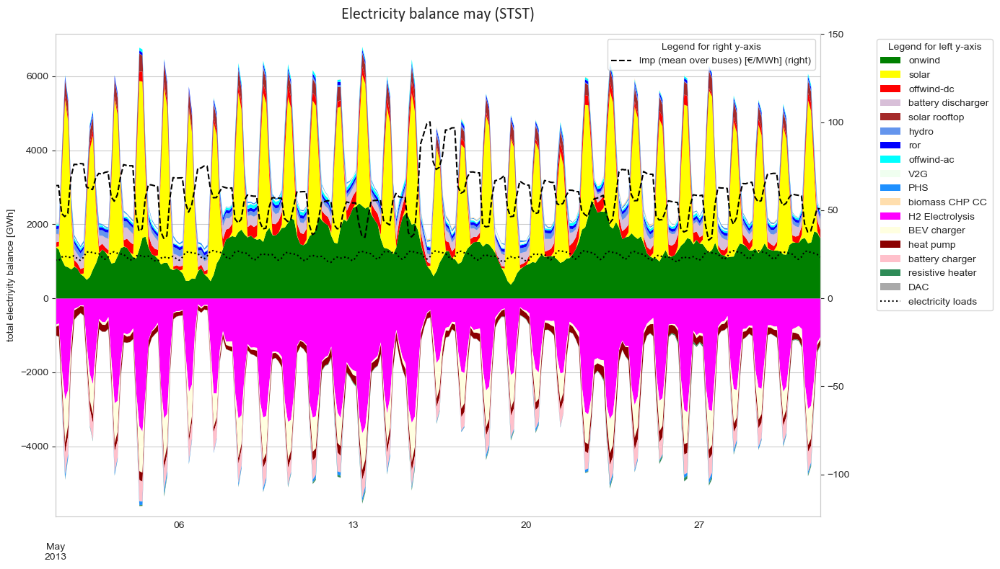

In [12]:
# thesis_plot

fig, ax = plt.subplots(figsize=(14, 8))

n = n_no
df = nb_el_no
df_loads = loads_el_no

# split into df with positive and negative values
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
# exclude all technologies that contribute less than th
th = 0.001
df_pos_share = df_pos.sum() / df_pos.sum().sum()
df_pos = df_pos[df_pos_share[df_pos_share > th].sort_values(ascending=False).index]
df_neg_share = df_neg.sum() / df_neg.sum().sum()
df_neg = df_neg[df_neg_share[df_neg_share > th].sort_values(ascending=False).index]
# get colors
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values that are also present on positive side, so that they are not shown and plot negative values
f = lambda c: '_' + c
cols = [f(c) if (c in df_pos.columns) else c for c in  df_neg.columns]
cols_map = dict(zip(df_neg.columns, cols))
ax = df_neg.rename(columns=cols_map).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period]
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)
# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads")

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("total electriyity balance [GWh]")
ax.set_xlabel("")
ax.set_title("Electricity balance may (STST)", fontsize=16, pad=15,  **font1)
fig.tight_layout()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_may_STST.png")

Further analysis

In [13]:
df_pos.sum()

carrier
onwind                345562.363252
solar                 338931.403660
offwind-dc             48960.333114
battery discharger     34117.878432
solar rooftop          33399.696680
hydro                  21041.679416
ror                    20065.206325
offwind-ac             14179.441963
V2G                     8102.933107
PHS                     3354.711438
biomass CHP CC          2211.845531
dtype: float64

- onwind only slighlty with most generation (not the case for June, July and August)
onwind,345562.363252
solar,338931.403660

In [14]:
df_neg

carrier,H2 Electrolysis,BEV charger,heat pump,battery charger,PHS,resistive heater,DAC
snapshot,,,,,,,
2013-05-01 00:00:00,-709.514501,-55.936232,-230.271011,-0.997366,0.000000,-1.135108,-4.846786
2013-05-01 03:00:00,-671.842886,-50.782888,-303.697183,-0.124167,0.000000,-8.685297,-4.846752
2013-05-01 06:00:00,-1932.708992,-352.207515,-302.569416,-231.662255,-66.944392,-28.003127,-4.846783
2013-05-01 09:00:00,-2727.122164,-1169.842882,-277.173022,-579.542177,-113.215714,-23.454737,-4.846792
2013-05-01 12:00:00,-2465.729728,-951.646293,-283.033166,-486.231291,-88.912298,-21.570060,-4.846303
...,...,...,...,...,...,...,...
2013-05-31 09:00:00,-2983.349810,-980.009512,-180.608449,-535.224385,-73.327041,-44.189621,-4.823103
2013-05-31 12:00:00,-2899.633047,-878.887014,-195.575599,-451.781806,-56.584516,-50.136552,-4.822735
2013-05-31 15:00:00,-2145.802741,-368.392123,-208.205952,-48.454321,-21.485765,-52.209747,-4.822576


In [15]:
# correlation of solar generation and lmp
nb_el_no[["solar", "solar rooftop"]].sum(axis=1).corr(lmps) # -0.6751
nb_el_no.onwind.corr(lmps) # -0.358751
nb_el_no.PHS.corr(lmps) # 0.78373
nb_el_no.PHS.corr(nb_el_no.solar) # -0.9022

-0.9022293674223766

In [16]:
# range of lmps
lmps.describe()

count    248.000000
mean      57.967083
std       12.923232
min       32.973028
25%       48.458793
50%       57.546951
75%       65.653280
max      100.124028
dtype: float64

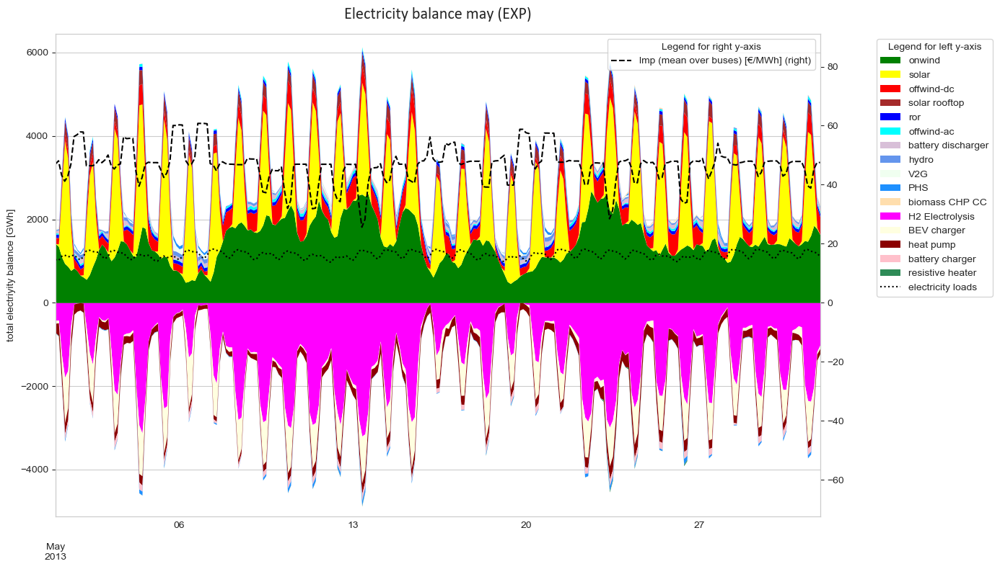

In [17]:
fig, ax = plt.subplots(figsize=(14, 8))

n = n_h2
df = nb_el_h2
df_loads = loads_el_h2

# split into df with positive and negative values
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
# exclude all technologies that contribute less than th
th = 0.001
df_pos_share = df_pos.sum() / df_pos.sum().sum()
df_pos = df_pos[df_pos_share[df_pos_share > th].sort_values(ascending=False).index]
df_neg_share = df_neg.sum() / df_neg.sum().sum()
df_neg = df_neg[df_neg_share[df_neg_share > th].sort_values(ascending=False).index]
# get colors
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values that are also present on positive side, so that they are not shown and plot negative values
f = lambda c: '_' + c
cols = [f(c) if (c in df_pos.columns) else c for c in  df_neg.columns]
cols_map = dict(zip(df_neg.columns, cols))
ax = df_neg.rename(columns=cols_map).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period]
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)
# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads")

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("total electriyity balance [GWh]")
ax.set_xlabel("")
ax.set_title("Electricity balance may (EXP)", fontsize=16, pad=15,  **font1)
fig.tight_layout()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_may_EXP.png")

In [18]:
# range of lmps
lmps.describe()

count    248.000000
mean      46.563079
std        5.898544
min       25.604811
25%       44.750596
50%       47.117279
75%       48.025135
max       60.767309
dtype: float64

### Electricity Balance (Jan)

In [19]:
carrier = ["AC", "low voltage"]
loads = ["electricity", "industry electricity", "agriculture electricity"]
period = "2013-01"
nb_el_no = nodal_balance(n_no, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
nb_el_h2 = nodal_balance(n_h2, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
# convert from MW to GW and unstack
nb_el_no = nb_el_no.unstack(level=[1]) / 1000
nb_el_h2 = nb_el_h2.unstack(level=[1]) / 1000
loads_el_no = abs(nb_el_no[loads].sum(axis=1))
loads_el_h2 = abs(nb_el_h2[loads].sum(axis=1))
nb_el_no.drop(loads, axis=1, inplace=True)
nb_el_h2.drop(loads, axis=1, inplace=True)

# condense groups
nb_el_no = get_condense_sum(nb_el_no, c1_groups, c1_groups_name)
nb_el_h2 = get_condense_sum(nb_el_h2, c1_groups, c1_groups_name)
# rename unhandy column names
nb_el_no.rename(columns=carrier_renaming, inplace=True)
nb_el_h2.rename(columns=carrier_renaming, inplace=True)

nb_el_no.head(3)

carrier,AC,BEV charger,DAC,DC,H2 Electrolysis,H2 Fuel Cell,OCGT,PHS,V2G,battery charger,...,solar rooftop,gas CHP,gas CHP CC,biomass CHP CC,resistive heater,gas boiler,heat pump,water tanks charger,water tanks discharger,solar thermal
snapshot,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,1.182343e-14,-471.667750,-4.701310,1.818989e-15,-2086.685643,NaN,NaN,-8.191668,5.377617,-27.560361,...,NaN,26.784181,0.002446,72.685865,-50.220569,0.0,-403.124125,0.0,0.0,0.0
2013-01-01 03:00:00,1.455192e-14,-339.458588,-4.701299,-2.728484e-15,-1902.041094,NaN,NaN,2.064618,7.421831,-30.929961,...,NaN,42.072599,0.002457,73.037867,-218.312261,0.0,-488.455926,0.0,0.0,0.0
2013-01-01 06:00:00,-2.182787e-14,-459.324499,-4.701317,2.273737e-15,-1845.437240,NaN,NaN,-9.096095,1.615203,-102.300655,...,52.107755,7.057945,0.002455,73.186171,-273.810208,0.0,-498.409860,0.0,0.0,0.0


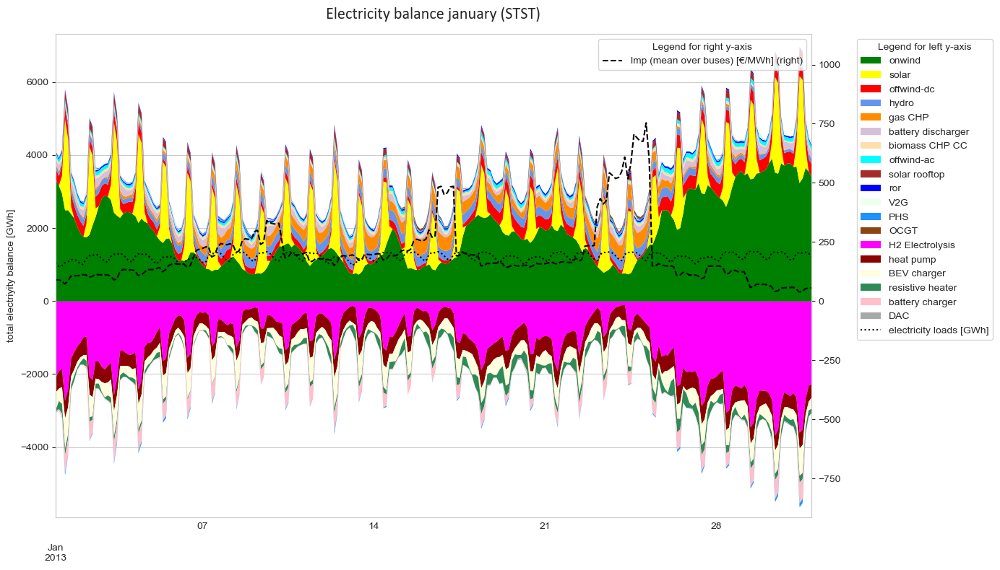

In [20]:
# thesis plot

fig, ax = plt.subplots(figsize=(14, 8))

n = n_no
df = nb_el_no
df_loads = loads_el_no

# split into df with positive and negative values
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
# exclude all technologies that contribute less than th
th = 0.001
df_pos_share = df_pos.sum() / df_pos.sum().sum()
df_pos = df_pos[df_pos_share[df_pos_share > th].sort_values(ascending=False).index]
df_neg_share = df_neg.sum() / df_neg.sum().sum()
df_neg = df_neg[df_neg_share[df_neg_share > th].sort_values(ascending=False).index]
# get colors
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values that are also present on positive side, so that they are not shown and plot negative values
f = lambda c: '_' + c
cols = [f(c) if (c in df_pos.columns) else c for c in  df_neg.columns]
cols_map = dict(zip(df_neg.columns, cols))
ax = df_neg.rename(columns=cols_map).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period]
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)
# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads [GWh]")

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("total electriyity balance [GWh]")
ax.set_xlabel("")
ax.grid(True)
ax.set_title("Electricity balance january (STST)", fontsize=16, pad=15,  **font1)
fig.tight_layout()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_jan_STST.png")

In [21]:
# range of lmps
lmps.describe()

count    248.000000
mean     198.406902
std      130.235958
min       38.643497
25%      124.710413
50%      162.967965
75%      215.261822
max      753.467762
dtype: float64

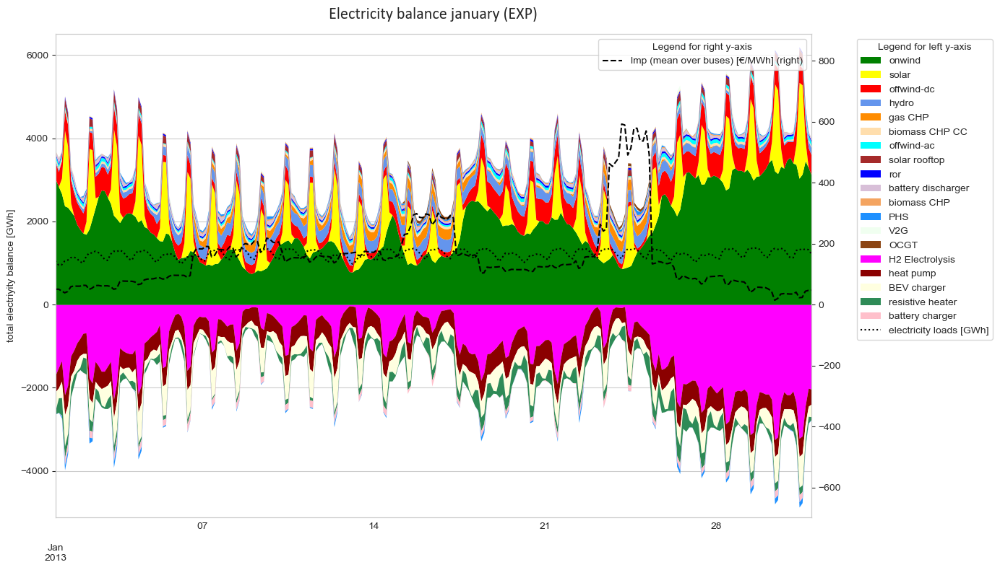

In [22]:
fig, ax = plt.subplots(figsize=(14, 8))

n = n_h2
df = nb_el_h2
df_loads = loads_el_h2

# split into df with positive and negative values
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
# exclude all technologies that contribute less than th
th = 0.001
df_pos_share = df_pos.sum() / df_pos.sum().sum()
df_pos = df_pos[df_pos_share[df_pos_share > th].sort_values(ascending=False).index]
df_neg_share = df_neg.sum() / df_neg.sum().sum()
df_neg = df_neg[df_neg_share[df_neg_share > th].sort_values(ascending=False).index]
# get colors
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values that are also present on positive side, so that they are not shown and plot negative values
f = lambda c: '_' + c
cols = [f(c) if (c in df_pos.columns) else c for c in  df_neg.columns]
cols_map = dict(zip(df_neg.columns, cols))
ax = df_neg.rename(columns=cols_map).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period]
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)
# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads [GWh]")

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("total electriyity balance [GWh]")
ax.set_xlabel("")
ax.grid(True)
ax.set_title("Electricity balance january (EXP)", fontsize=16, pad=15,  **font1)
fig.tight_layout()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_jan_EXP.png")

In [23]:
# range of lmps
lmps.describe()

count    248.000000
mean     153.146098
std      111.468722
min       14.405703
25%       83.221548
50%      133.236972
75%      173.552668
max      592.367175
dtype: float64

### Electricity balance (all year)

In [24]:
carrier = ["AC", "low voltage"]
loads = ["electricity", "industry electricity", "agriculture electricity"]
period = "2013"
nb_el_no = nodal_balance(n_no, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
nb_el_h2 = nodal_balance(n_h2, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=True)  # in units of energy
# convert from MW to GW and unstack
nb_el_no = nb_el_no.unstack(level=[1]) / 1000
nb_el_h2 = nb_el_h2.unstack(level=[1]) / 1000
loads_el_no = abs(nb_el_no[loads].sum(axis=1))
loads_el_h2 = abs(nb_el_h2[loads].sum(axis=1))
nb_el_no.drop(loads, axis=1, inplace=True)
nb_el_h2.drop(loads, axis=1, inplace=True)

# condense groups
nb_el_no_all = get_condense_sum(nb_el_no, c1_groups, c1_groups_name)
nb_el_h2_all = get_condense_sum(nb_el_h2, c1_groups, c1_groups_name)
# rename unhandy column names
nb_el_no_all.rename(columns=carrier_renaming, inplace=True)
nb_el_h2_all.rename(columns=carrier_renaming, inplace=True)

nb_el_no_all.head(3)

carrier,AC,BEV charger,DAC,DC,H2 Electrolysis,H2 Fuel Cell,OCGT,PHS,V2G,battery charger,...,solar rooftop,gas CHP,gas CHP CC,biomass CHP CC,resistive heater,gas boiler,heat pump,water tanks charger,water tanks discharger,solar thermal
snapshot,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,1.182343e-14,-471.667750,-4.701310,1.818989e-15,-2086.685643,NaN,NaN,-8.191668,5.377617,-27.560361,...,NaN,26.784181,0.002446,72.685865,-50.220569,0.0,-403.124125,0.0,0.0,0.0
2013-01-01 03:00:00,1.455192e-14,-339.458588,-4.701299,-2.728484e-15,-1902.041094,NaN,NaN,2.064618,7.421831,-30.929961,...,NaN,42.072599,0.002457,73.037867,-218.312261,0.0,-488.455926,0.0,0.0,0.0
2013-01-01 06:00:00,-2.182787e-14,-459.324499,-4.701317,2.273737e-15,-1845.437240,NaN,NaN,-9.096095,1.615203,-102.300655,...,52.107755,7.057945,0.002455,73.186171,-273.810208,0.0,-498.409860,0.0,0.0,0.0


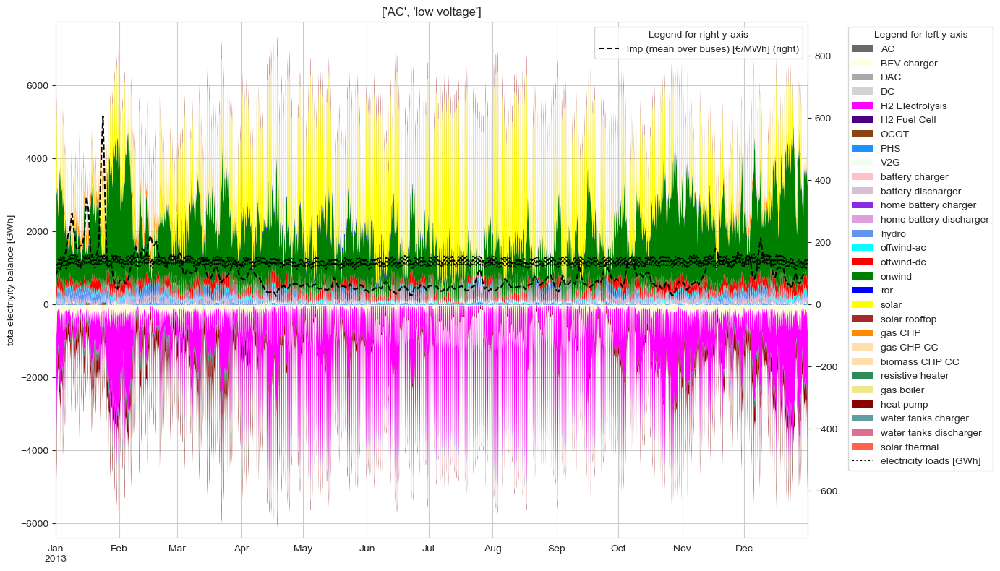

In [25]:
fig, ax = plt.subplots(figsize=(14, 8))

n = n_no
# "8h", "D", "W", "M"
res = "D"
df = nb_el_no_all#.resample(res).sum()
df_loads = loads_el_no#.resample(res).sum()

# split into df with positive and negative values and get colors
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values so that they are not shown and plot negative values
ax = df_neg.rename(columns=lambda x: '_' + x).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period].resample(res).mean()
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads [GWh]")

# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("tota electriyity balance [GWh]")
ax.set_xlabel("")
ax.grid(True)
ax.set_title(f"{carrier}")
fig.tight_layout()

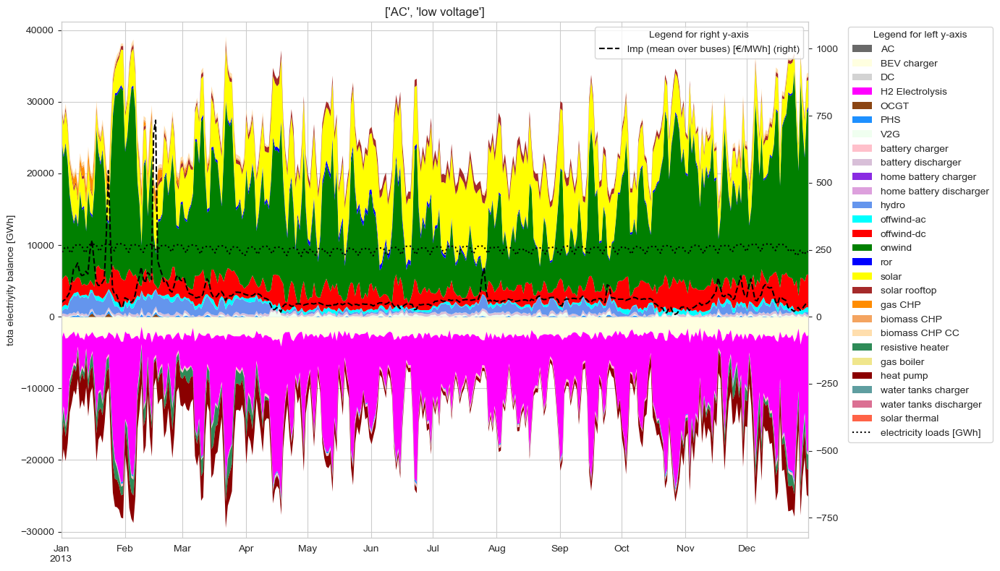

In [26]:
fig, ax = plt.subplots(figsize=(14, 8))

n = n_h2
# "8h", "D", "W", "M"
res = "D"
df = nb_el_h2_all.resample(res).sum()
df_loads = loads_el_h2.resample(res).sum()

# split into df with positive and negative values and get colors
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values so that they are not shown and plot negative values
ax = df_neg.rename(columns=lambda x: '_' + x).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period].resample(res).mean()
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads [GWh]")

# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("tota electriyity balance [GWh]")
ax.set_xlabel("")
ax.grid(True)
ax.set_title(f"{carrier}")
fig.tight_layout()

### Electricity Balances special cases

In [27]:
carrier = ["AC", "low voltage"]
loads = ["electricity", "industry electricity", "agriculture electricity"]
start_date = "2013-01-23 00:00:00"
end_date = "2013-01-25 00:00:00"
period = n_no.generators_t.p.index[(n_no.generators_t.p.index >= start_date) & (n_no.generators_t.p.index <= end_date)]
nb_el_no = nodal_balance(n_no, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=False)  # in units of energy
nb_el_h2 = nodal_balance(n_h2, carrier = carrier, time=period, aggregate=['component', 'bus'], energy=False)  # in units of energy
# convert from MW to GW and unstack
nb_el_no = nb_el_no.unstack(level=[1]) / 1000
nb_el_h2 = nb_el_h2.unstack(level=[1]) / 1000
loads_el_no = abs(nb_el_no[loads].sum(axis=1))
loads_el_h2 = abs(nb_el_h2[loads].sum(axis=1))
nb_el_no.drop(loads, axis=1, inplace=True)
nb_el_h2.drop(loads, axis=1, inplace=True)

# condense groups
nb_el_no = get_condense_sum(nb_el_no, c1_groups, c1_groups_name)
nb_el_h2 = get_condense_sum(nb_el_h2, c1_groups, c1_groups_name)
# rename unhandy column names
nb_el_no.rename(columns=carrier_renaming, inplace=True)
nb_el_h2.rename(columns=carrier_renaming, inplace=True)

nb_el_no.head(3)

carrier,AC,BEV charger,DAC,DC,H2 Electrolysis,H2 Fuel Cell,OCGT,PHS,V2G,battery charger,...,solar rooftop,gas CHP,gas CHP CC,biomass CHP CC,resistive heater,gas boiler,heat pump,water tanks charger,water tanks discharger,solar thermal
snapshot,,,,,,,,,,,,,,,,,,,,,
2013-01-23 00:00:00,2.273737e-16,-137.064159,-1.087380,0.000006,-89.229443,0.554258,11.683333,7.482773,1.722181,-0.901485,...,NaN,119.762529,0.002854,26.023862,-11.621559,0.0,-110.587478,0.0,0.0,0.0
2013-01-23 03:00:00,-4.320100e-15,-69.432767,-0.584167,0.000006,-56.367059,0.554259,15.024421,9.761353,2.938768,-0.018482,...,NaN,125.505818,0.002859,26.023875,-93.406232,0.0,-142.552247,0.0,0.0,0.0
2013-01-23 06:00:00,-1.364242e-15,-57.028803,-0.547156,0.000012,-90.911222,0.554259,16.304600,9.752706,1.128752,-16.131363,...,16.517388,134.866186,0.002859,26.023875,-113.873389,0.0,-140.430216,0.0,0.0,0.0


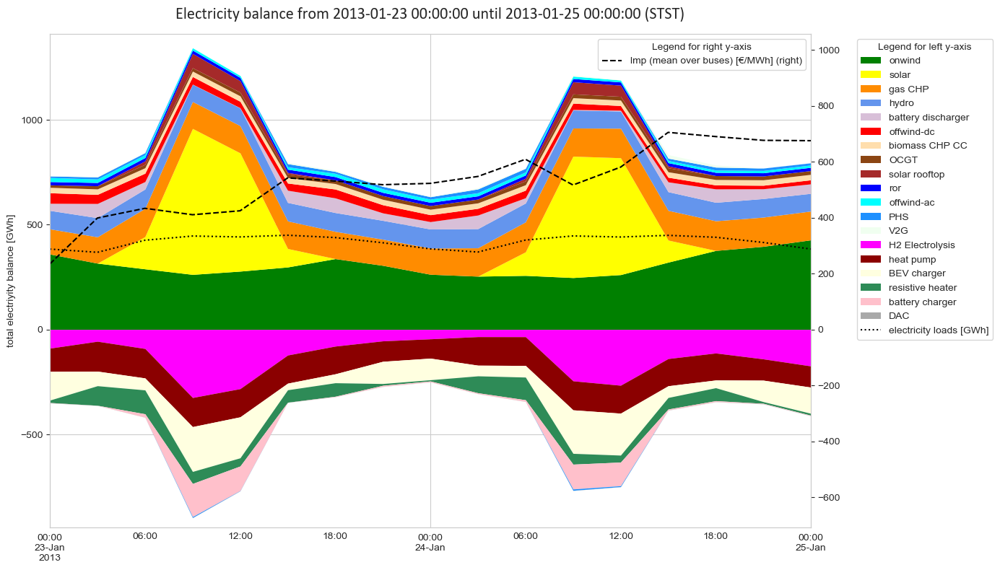

In [28]:
fig, ax = plt.subplots(figsize=(14, 8))

model = "STST"

if model == "STST":
    n = n_no
    df = nb_el_no
    df_loads = loads_el_no
elif model == "EXP":
    n = n_h2
    df = nb_el_h2
    df_loads = loads_el_h2

# split into df with positive and negative values
df_neg, df_pos = df.clip(upper=0), df.clip(lower=0)
# exclude all technologies that contribute less than th
th = 0.001
df_pos_share = df_pos.sum() / df_pos.sum().sum()
df_pos = df_pos[df_pos_share[df_pos_share > th].sort_values(ascending=False).index]
df_neg_share = df_neg.sum() / df_neg.sum().sum()
df_neg = df_neg[df_neg_share[df_neg_share > th].sort_values(ascending=False).index]
# get colors
c_neg, c_pos = [carrier_colors[col] for col in df_neg.columns], [carrier_colors[col] for col in df_pos.columns]

# plot positive values
ax = df_pos.plot.area(ax=ax, stacked=True, color=c_pos, linewidth=0.)

# rename negative values that are also present on positive side, so that they are not shown and plot negative values
f = lambda c: '_' + c
cols = [f(c) if (c in df_pos.columns) else c for c in  df_neg.columns]
cols_map = dict(zip(df_neg.columns, cols))
ax = df_neg.rename(columns=cols_map).plot.area(ax=ax, stacked=True, color=c_neg, linewidth=0.)

# plot lmps
lmps = n.buses_t.marginal_price[n.buses[n.buses.carrier.isin(carrier)].index].mean(axis=1)[period]
ax2 = lmps.plot(style="--", color="black", label="lmp (mean over buses) [€/MWh]", secondary_y=True)
ax2.grid(False)
# set limits of secondary y-axis
ax2.set_ylim([ - 1.5 * lmps.max() * abs(df_neg.sum(axis=1).min()) /  df_pos.sum(axis=1).max() , 1.5 * lmps.max()])

# plot loads
df_loads.plot(style=":", color="black", label="electricity loads [GWh]")

# rescale the y-axis
ax.set_ylim([1.05*df_neg.sum(axis=1).min(), 1.05*df_pos.sum(axis=1).max()])
ax.legend(ncol=1, loc="upper center", bbox_to_anchor=(1.15, 1), title="Legend for left y-axis")
ax2.legend(title="Legend for right y-axis",  loc="upper right")
ax.set_ylabel("total electriyity balance [GWh]")
ax.set_xlabel("")
ax.grid(True)
ax.set_title(f"Electricity balance from {start_date} until {end_date} ({model})", fontsize=16, pad=15,  **font1)
fig.tight_layout()

# fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_{datetime.strptime(start_date, '%Y-%m-%d %H:%M:%S').strftime('%Y-%m-%d_%H_%M_%S')}__{datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S').strftime('%Y-%m-%d_%H_%M_%S')}_{model}.png")

### Monthly Balance

In [29]:
# get list of months
month_list = pd.period_range(start='2013-01-01', end='2013-12-31', freq='M')
month_list = [month.strftime("%b-%Y") for month in month_list]

res_no_all_pos = pd.DataFrame(index=month_list, columns= nb_el_no_all.columns)
res_no_all_neg = pd.DataFrame(index=month_list, columns= nb_el_no_all.columns)
res_h2_all_pos = pd.DataFrame(index=month_list, columns= nb_el_h2_all.columns)
res_h2_all_neg = pd.DataFrame(index=month_list, columns= nb_el_h2_all.columns)

iterables = [month_list, ["no H2 network", "H2 network"]]
multiindex = pd.MultiIndex.from_product(iterables, names=["month", "scenario"])
index_union = nb_el_no_all.columns.union(nb_el_h2_all.columns)
res_pos = pd.DataFrame(index=multiindex, columns=index_union)
res_neg = pd.DataFrame(index=multiindex, columns=index_union)

df_no_neg, df_no_pos = nb_el_no_all.clip(upper=0), nb_el_no_all.clip(lower=0)
df_h2_neg, df_h2_pos = nb_el_h2_all.clip(upper=0), nb_el_h2_all.clip(lower=0)

for month in month_list:
    res_no_all_pos.loc[month] = df_no_pos[month].sum()
    res_no_all_neg.loc[month] = df_no_neg[month].sum()
    res_h2_all_pos.loc[month] = df_h2_pos[month].sum()
    res_h2_all_neg.loc[month] = df_h2_neg[month].sum()

    res_pos.loc[month, "no H2 network"] = df_no_pos[month].sum()
    res_pos.loc[month, "H2 network"] = df_h2_pos[month].sum()
    res_neg.loc[month, "no H2 network"] = df_no_neg[month].sum()
    res_neg.loc[month, "H2 network"] = df_h2_neg[month].sum()

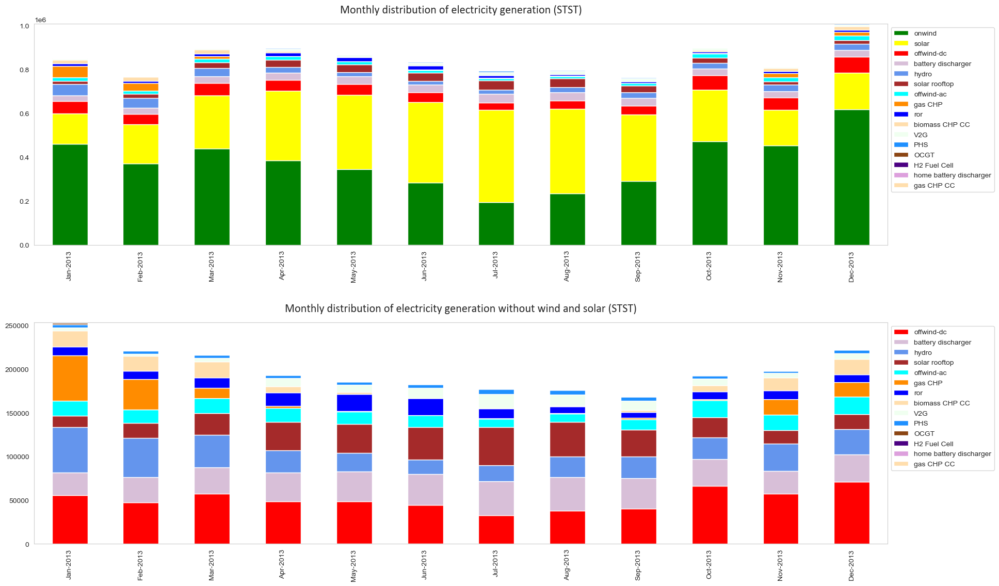

In [30]:
# thesis plot (STST)

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(20, 12))

# sort carriers by ouptut and exclude all with less than 1 GW
i_no_gen = res_no_all_pos.sum().sort_values(ascending=False)[res_no_all_pos.sum().sort_values(ascending=False) > 1].index

res_no_all_pos[i_no_gen].plot(ax=ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_no_all_pos[i_no_gen].columns])
ax1.legend(ncol=1, bbox_to_anchor=(1, 1))
ax1.set_title("Monthly distribution of electricity generation (STST)", fontsize=16, pad=15,  **font1)

# exclude solar and onwind
i_no_gen_ex = i_no_gen.drop(["onwind", "solar"])

res_no_all_pos[i_no_gen_ex].plot(ax=ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_pos[i_no_gen_ex].columns])
ax2.legend(ncol=1, bbox_to_anchor=(1, 1))
ax2.set_title("Monthly distribution of electricity generation without wind and solar (STST)", fontsize=16, pad=15,  **font1)

fig.tight_layout(pad=3)
fig.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_monthly_STST.png")

In [31]:
# Further investigation
res_no_all_pos[i_no_gen_ex]["gas CHP CC"].loc[["Jan-2013", "Feb-2013"]].sum() / (res_no_all_pos[i_no_gen_ex]["gas CHP CC"].sum() - res_no_all_pos[i_no_gen_ex]["gas CHP CC"].loc[["Jan-2013", "Feb-2013"]].sum())

0.810150056705856

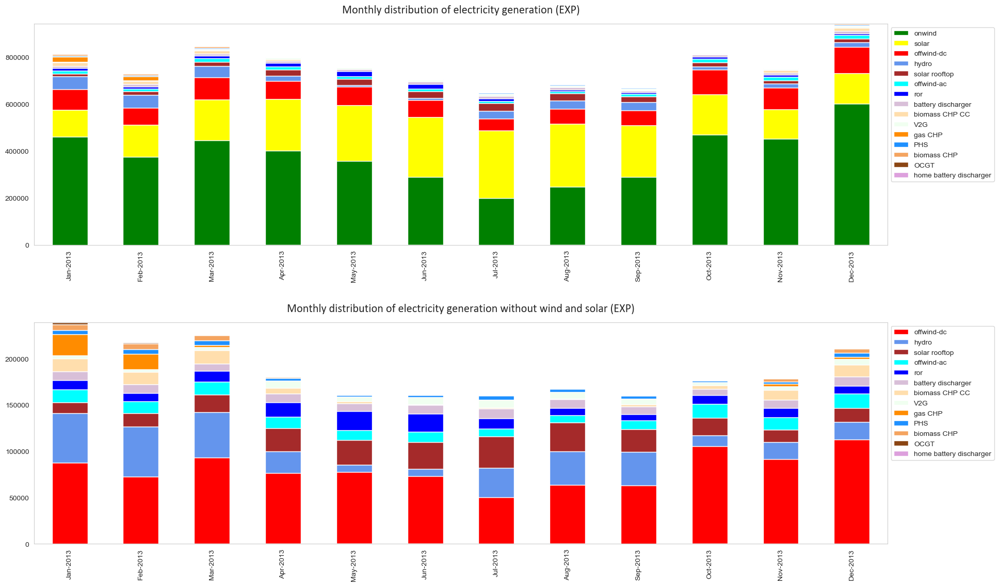

In [32]:
# EXP

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(20, 12))

# sort carriers by ouptut and exclude all with less than 1 GW
i_h2_gen = res_h2_all_pos.sum().sort_values(ascending=False)[res_h2_all_pos.sum().sort_values(ascending=False) > 1].index

res_h2_all_pos[i_h2_gen].plot(ax=ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_h2_all_pos[i_h2_gen].columns])
ax1.legend(ncol=1, bbox_to_anchor=(1, 1))
ax1.set_title("Monthly distribution of electricity generation (EXP)", fontsize=16, pad=15,  **font1)

# exclude solar and onwind
i_h2_gen_ex = i_h2_gen.drop(["onwind", "solar"])

res_h2_all_pos[i_h2_gen_ex].plot(ax=ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_pos[i_h2_gen_ex].columns])
ax2.legend(ncol=1, bbox_to_anchor=(1, 1))
ax2.set_title("Monthly distribution of electricity generation without wind and solar (EXP)", fontsize=16, pad=15,  **font1)

fig.tight_layout(pad=3)
fig.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_bal_monthly_EXP.png")

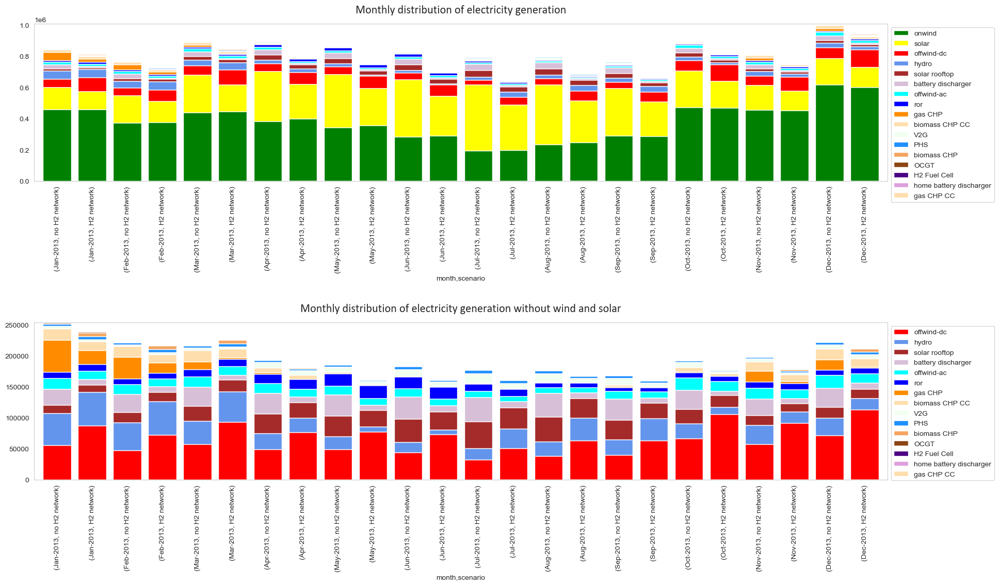

In [33]:
# both scenarios

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(20, 12))

# sort carriers by ouptut and exclude all with less than 1 GW
index = res_pos.sum().sort_values(ascending=False)[res_pos.sum().sort_values(ascending=False) > 1].index

res_pos[index].plot(ax=ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_pos[index].columns], width=0.8)
ax1.legend(ncol=1, bbox_to_anchor=(1, 1))
ax1.set_title("Monthly distribution of electricity generation", fontsize=16, pad=15,  **font1)

# exclude solar and onwind
index = index.drop(["onwind", "solar"])

res_pos[index].plot(ax=ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_pos[index].columns], width=0.8)
ax2.legend(ncol=1, bbox_to_anchor=(1, 1))
ax2.set_title("Monthly distribution of electricity generation without wind and solar", fontsize=16, pad=15,  **font1)

fig.tight_layout(pad=3)
fig.show()

In [34]:
# consumption carriers
abs(res_no_all_neg.sum()).sort_values(ascending=False)[abs(res_no_all_neg.sum()).sort_values(ascending=False) > 1].index

Index(['H2 Electrolysis', 'BEV charger', 'heat pump', 'battery charger',
       'resistive heater', 'PHS', 'DAC', 'home battery charger'],
      dtype='object', name='carrier')

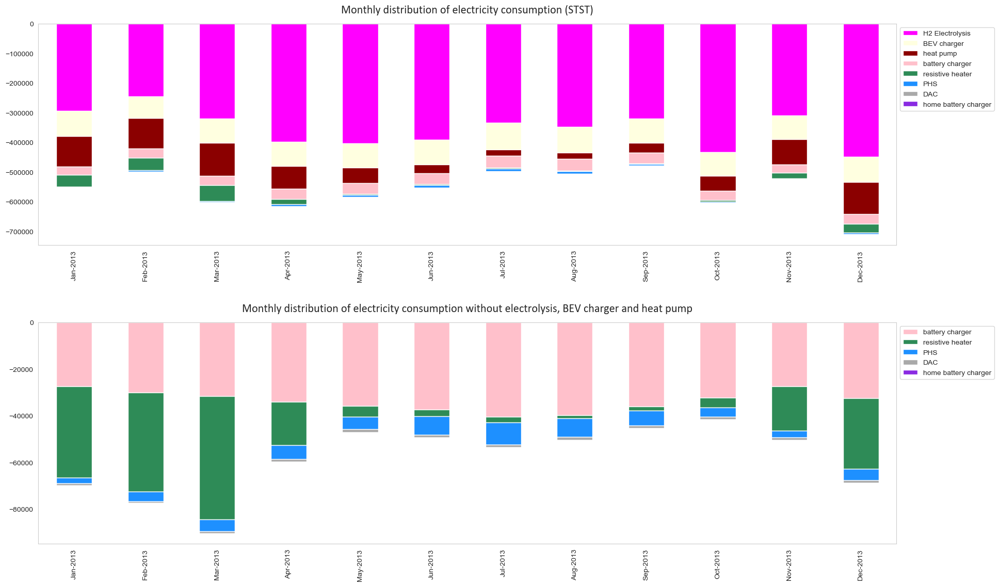

In [35]:
# STST

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(20, 12))

# sort carriers by ouptut and exclude all with less than 1 GW
i_no_con = abs(res_no_all_neg.sum()).sort_values(ascending=False)[abs(res_no_all_neg.sum()).sort_values(ascending=False) > 1].index

res_no_all_neg[i_no_con].plot(ax=ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_no_all_neg[i_no_con].columns])
ax1.legend(ncol=1, bbox_to_anchor=(1, 1))
ax1.set_title("Monthly distribution of electricity consumption (STST)", fontsize=16, pad=15,  **font1)

# exclude
i_no_con_ex = i_no_con.drop(["H2 Electrolysis", "BEV charger", "heat pump"])

res_no_all_neg[i_no_con_ex].plot(ax=ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_no_all_neg[i_no_con_ex].columns])
ax2.legend(ncol=1, bbox_to_anchor=(1, 1))
ax2.set_title("Monthly distribution of electricity consumption without electrolysis, BEV charger and heat pump", fontsize=16, pad=15,  **font1)

fig.tight_layout(pad=3)
fig.show()

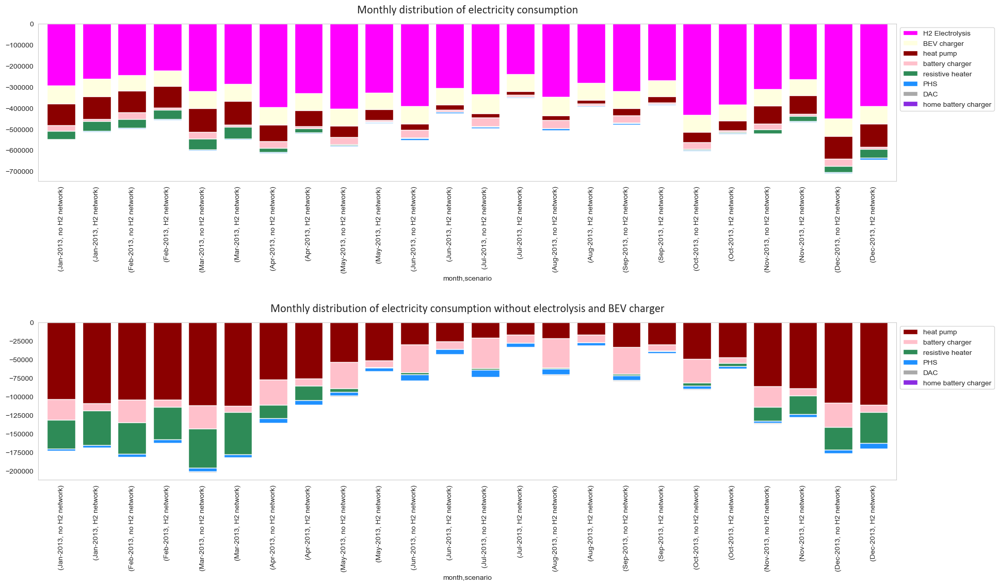

In [36]:
# both

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(20, 12))

# sort carriers by ouptut and exclude all with less than 1 GW
index = abs(res_neg.sum()).sort_values(ascending=False)[abs(res_neg.sum()).sort_values(ascending=False) > 1].index

res_neg[index].plot(ax=ax1, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_neg[index].columns], width=0.8)
ax1.legend(ncol=1, bbox_to_anchor=(1, 1))
ax1.set_title("Monthly distribution of electricity consumption", fontsize=16, pad=15,  **font1)

# exclude
index = index.drop(["H2 Electrolysis", "BEV charger"])

res_neg[index].plot(ax=ax2, kind="bar", stacked=True, grid=False, color=[carrier_colors[c] for c in res_neg[index].columns], width=0.8)
ax2.legend(ncol=1, bbox_to_anchor=(1, 1))
ax2.set_title("Monthly distribution of electricity consumption without electrolysis and BEV charger", fontsize=16, pad=15,  **font1)

fig.tight_layout(pad=3)
fig.show()

## Focus on technologies

In [37]:
n.generators_t.p.loc[:, (n.generators.carrier == "onwind") | (n.generators.carrier == "solar")]

Generator,AL0 0 onwind,AL0 0 solar,AT0 0 onwind,AT0 0 solar,AT0 1 onwind,AT0 1 solar,AT0 2 onwind,AT0 2 solar,BA0 0 onwind,BA0 0 solar,...,SE3 5 onwind,SE3 5 solar,SE3 6 onwind,SE3 6 solar,SE3 7 onwind,SE3 7 solar,SI0 0 onwind,SI0 0 solar,SK0 0 onwind,SK0 0 solar
snapshot,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,0.000000,0.000000,4917.113011,0.000000,0.000160,0.000000,0.000317,0.000000,0.0,0.000000,...,0.009930,0.0,3853.975032,0.000000,0.018161,0.0,0.001395,0.000000,2246.743658,0.000000
2013-01-01 03:00:00,0.000000,0.000000,4623.535568,0.000000,0.000105,0.000000,0.000000,0.000000,0.0,0.000000,...,0.006851,0.0,3520.456123,0.000000,0.017416,0.0,0.001238,0.000000,2485.810713,0.000000
2013-01-01 06:00:00,0.000000,4795.128080,3455.948969,792.324661,0.000061,1207.124091,0.000000,3648.126751,0.0,2163.155608,...,0.003427,0.0,2849.870100,0.000000,0.024743,0.0,0.001435,73.953620,2579.209744,3528.485426
2013-01-01 09:00:00,0.000000,11509.646090,1471.522842,2989.259557,0.000000,5691.630927,0.000000,17190.506061,0.0,6556.602548,...,0.002262,0.0,1927.536014,2301.055350,0.019145,0.0,0.001177,295.573320,117.748709,12031.508302
2013-01-01 12:00:00,0.000000,6377.253396,497.291894,1678.141986,0.000000,4162.664607,0.000000,10963.896984,0.0,3854.296060,...,0.001043,0.0,1374.008866,527.732840,0.013911,0.0,0.003469,181.161924,1366.563887,5903.436923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-12-31 09:00:00,0.000000,4911.200758,448.489909,1048.040739,0.000000,4358.484623,0.000000,11081.941443,0.0,2405.977669,...,0.047624,0.0,4166.463368,257.691648,0.009419,0.0,0.000000,27.487703,70.096230,5975.378402
2013-12-31 12:00:00,0.000000,2989.734046,1290.876086,710.217489,0.000000,2908.464725,0.000000,7371.530007,0.0,1331.959089,...,0.044853,0.0,3814.872374,0.000000,0.024671,0.0,0.000000,23.930369,192.076450,3668.524451
2013-12-31 15:00:00,0.000000,0.000000,1932.721807,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.031277,0.0,2782.503953,0.000000,0.036083,0.0,0.000000,0.000000,463.552587,0.000000


### Load Duration curves

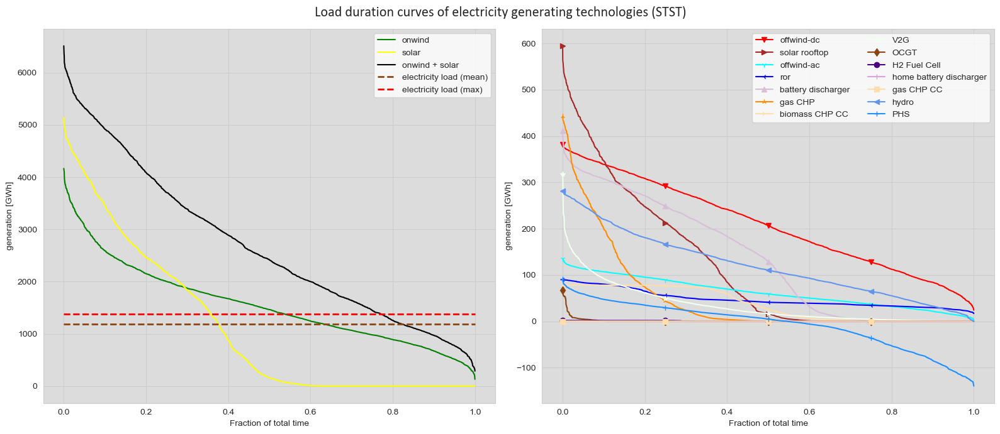

In [38]:
# thesis plot

# STST
n = n_no

# reverse renaming to find all carriers in network
i_no_gen_ex_rev = [carrier_renaming_reverse.get(n, n) for n in i_no_gen_ex]
index = list(i_no_gen_ex_rev)

fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))

for c in ["onwind", "solar"]:
    gen = (n.generators_t.p.loc[:, n.generators.carrier == c] / 1000)*3
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax1.plot(gen, color = carrier_colors[c], label=c)

# plot solar + onwind
gen = (n.generators_t.p.loc[:, (n.generators.carrier == "onwind") | (n.generators.carrier == "solar")] / 1000)*3
gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
ax1.plot(gen, color = "black", label= "onwind + solar")

# plot load
load = (n_no.loads_t.p.loc[: , n_no.loads.carrier.isin(["electricity", "industry electricity", "agriculture electricity"])].sum(axis=1) / 1000) * 3
ax1.hlines(y=load.mean(), xmin=0, xmax=1, ls="dashed", linewidth=2, color='saddlebrown', label="electricity load (mean)")
ax1.hlines(y=load.max(), xmin=0, xmax=1, ls="dashed", linewidth=2, color='red', label = "electricity load (max)")

ax1.set_ylabel("generation [GWh]")
ax1.set_xlabel("Fraction of total time")
ax1.set_facecolor("gainsboro")
ax1.legend()

for c in c_gen(index, n_no):
    if c == "":
        continue
    gen = (n.generators_t.p.loc[:, n.generators.carrier == c] / 1000)*3
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_link(index, n_no):
    gen = (-n.links_t.p1.loc[:, n.links.carrier == c] / 1000)*3
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c.replace("urban central solid ", "").replace("urban central ", ""),marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_su(index, n_no):
    gen = (n.storage_units_t.p.loc[:, n.storage_units.carrier == c] / 1000)*3
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

ax2.set_ylabel("generation [GWh]")
ax2.set_xlabel("Fraction of total time")
ax2.set_facecolor("gainsboro")
ax2.legend(ncol=2)

fig.suptitle("Load duration curves of electricity generating technologies (STST)", fontsize=16, **font1)
fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/load_dur_gen_STST.png")

1187.7221435887188

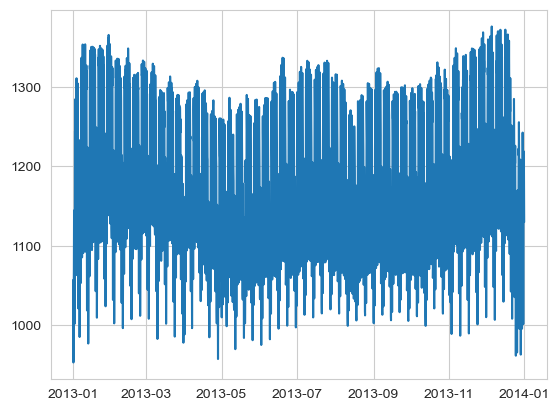

In [39]:
load = (n_no.loads_t.p.loc[: , n_no.loads.carrier.isin(["electricity", "industry electricity", "agriculture electricity"])].sum(axis=1) / 1000) * 3
plt.plot(load)
load.mean()

In [40]:
c = "OCGT"
gen = (-n.links_t.p1.loc[:, n.links.carrier == c] / 1000)*3
gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
gen

,0
0.000000,66.677052
0.000343,65.541053
0.000685,60.916631
0.001028,58.146101
0.001370,56.882450
...,...
0.998630,0.000504
0.998972,0.000503
0.999315,0.000499
0.999657,0.000486


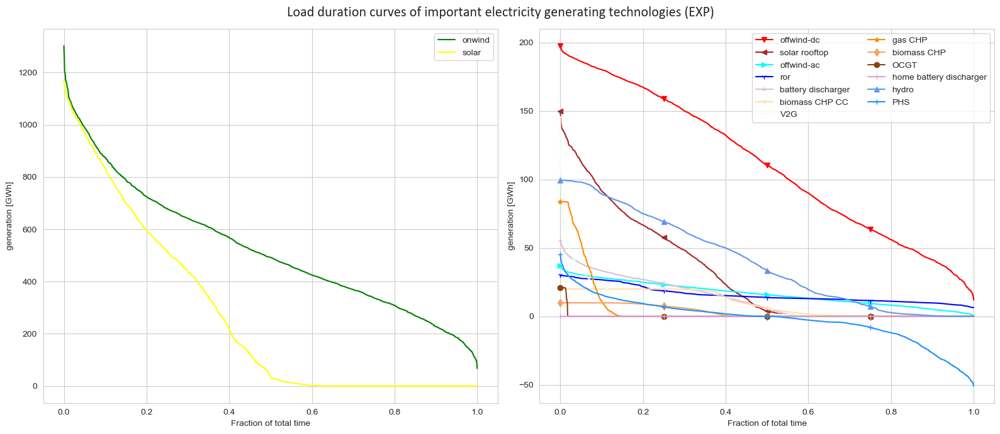

In [41]:
# EXP
n = n_h2

# reverse renaming to find all carriers in network
i_h2_gen_ex_rev = [carrier_renaming_reverse.get(n, n) for n in i_h2_gen_ex]
index = list(i_h2_gen_ex_rev)

fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))

for c in ["onwind", "solar"]:
    gen = n.generators_t.p.loc[:, n.generators.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax1.plot(gen, color = carrier_colors[c], label=c)

ax1.set_ylabel("generation [GWh]")
ax1.set_xlabel("Fraction of total time")
ax1.legend()

for c in c_gen(index, n_no):
    if c == "":
        continue
    gen = n.generators_t.p.loc[:, n.generators.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_link(index, n_no):
    gen = -n.links_t.p1.loc[:, n.links.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c.replace("urban central solid ", "").replace("urban central ", ""), marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_su(index, n_no):
    gen = n.storage_units_t.p.loc[:, n.storage_units.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

ax2.set_ylabel("generation [GWh]")
ax2.set_xlabel("Fraction of total time")
ax2.legend(ncol=2)

fig.suptitle("Load duration curves of important electricity generating technologies (EXP)", fontsize=16, **font1)
fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/load_dur_gen_EXP.png")

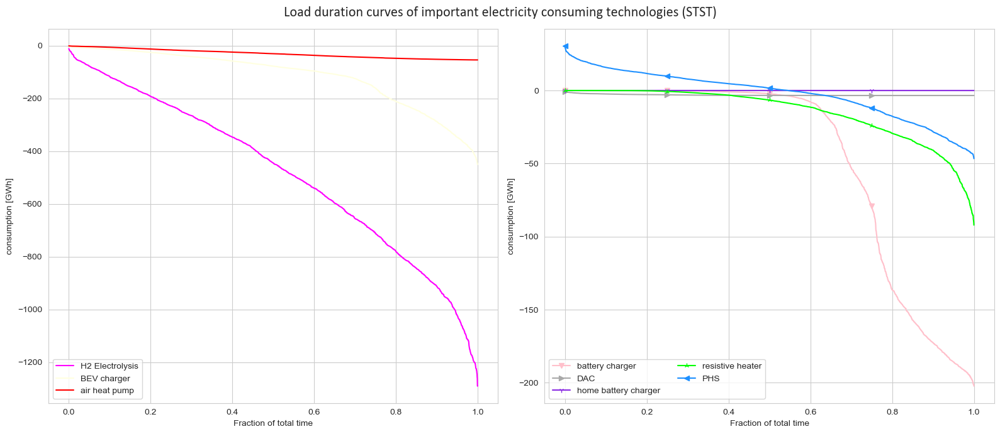

In [42]:
# STST consumption
n = n_no

# reverse renaming to find all carriers in network
i_no_gen_ex_rev = [carrier_renaming_reverse.get(n, n) for n in i_no_gen_ex]
index = list(i_no_gen_ex_rev)

fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))

index = ["H2 Electrolysis", "BEV charger"] + ["urban central air heat pump"] #heat_pump # heat pump is missing due to grouping

for c in c_gen(index, n_no):
    gen = n.generators_t.p.loc[:, n.generators.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax1.plot(gen, color = carrier_colors[c], label=c)

for c in c_link(index, n_no):
    gen = -n.links_t.p0.loc[:, n.links.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax1.plot(gen, color = carrier_colors[c], label=c.replace("urban central solid ", "").replace("urban central ", ""))

ax1.set_ylabel("consumption [GWh]")
ax1.set_xlabel("Fraction of total time")
ax1.legend(loc="lower left")

index = list(i_no_con_ex) + ["urban central resistive heater"] #resistive_heater # resistive heater is missing due to grouping

for c in c_gen(index, n_no):
    gen = n.generators_t.p.loc[:, n.generators.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_link(index, n_no):
    gen = -n.links_t.p0.loc[:, n.links.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c.replace("urban central solid ", "").replace("urban central ", ""), marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

for c in c_su(index, n_no):
    gen = n.storage_units_t.p.loc[:, n.storage_units.carrier == c] / 1000
    gen = pd.DataFrame(gen.sum(axis=1).sort_values(ascending=False)).set_index(pd.Index(np.linspace(0, 1, num=2920)))
    ax2.plot(gen, color = carrier_colors[c], label=c, marker=markers[index.index(c)], markevery=[0,int(0.25*2920), int(0.5*2920),int(0.75*2920)-1])

ax2.set_ylabel("consumption [GWh]")
ax2.set_xlabel("Fraction of total time")
ax2.legend(loc="lower left", ncol=2)

fig.suptitle("Load duration curves of important electricity consuming technologies (STST)", fontsize=16, **font1)
fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/load_dur_con_STST.png")

Questions:
- Does it make more sense for the consuming carriers to look at p0 or p1? just difference in magnitude and sign

Findings

### Capacity factors

**Question:**
- You have to aggregate over two dimensions: space and time
- Which dimension makes more sense to aggregate over
- You could visualize space coponent via map or boxplot
- You could visualize time component via heatmap

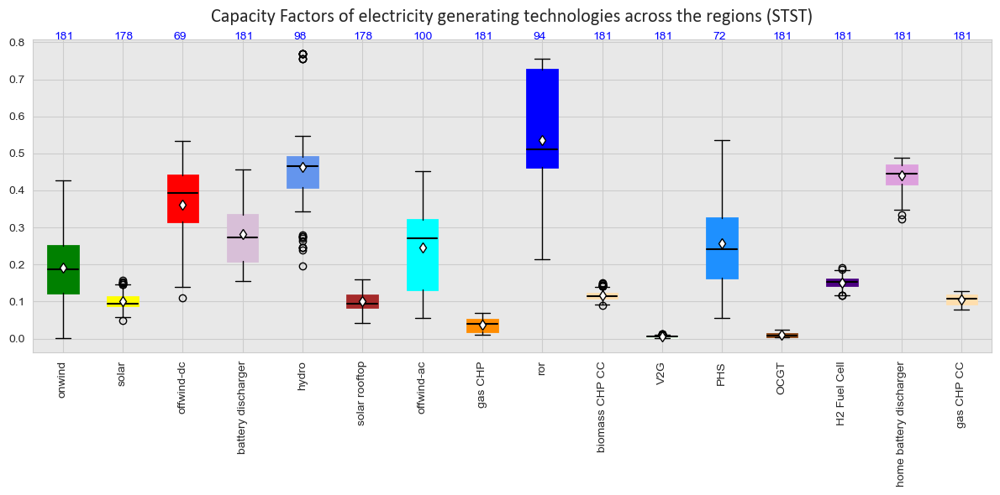

In [43]:
# capacity factors across regions as boxplot

boxprops=dict(facecolor="white", color="white")
medianprops = dict(color="black",linewidth=1.5)
meanprops = {"marker":"d","markerfacecolor":"white", "markeredgecolor":"black"}

i_no_gen_rev = [carrier_renaming_reverse.get(n, n) for n in i_no_gen]
df = df_no_ons[[f"{i}_cf" for i in i_no_gen_rev]]
df = df.values

# Filter data using np.isnan
mask = ~np.isnan(df)
filtered_data = [d[m] for d, m in zip(df.T, mask.T)]

fig, ax = plt.subplots(figsize=(12, 6))
bp = plt.boxplot(x=filtered_data, labels =i_no_gen, patch_artist=True, showmeans=True, boxprops=boxprops, meanprops=meanprops, medianprops=medianprops)

for box, col in zip(bp['boxes'],[carrier_colors[c] for c in i_no_gen]):
    # change outline color
    box.set(color=col, linewidth=2)

for i, sample_size in enumerate(df_no_ons[[f"{i}_cf" for i in i_no_gen_rev]].count()):
    ax.annotate(sample_size, xy=(0,0),  xycoords='axes fraction',
        xytext=((i+0.35)/16,1), textcoords='axes fraction', color="blue")

ax.patch.set_facecolor('lightgrey')
ax.patch.set_alpha(0.5)
plt.xticks(rotation=90)
plt.title("Capacity Factors of electricity generating technologies across the regions (STST)", fontsize=16, pad=15,  **font1)
fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/cap_fac_el_gen_STST.png")

# diamond indicates the mean (rest is like in normal boxplot)

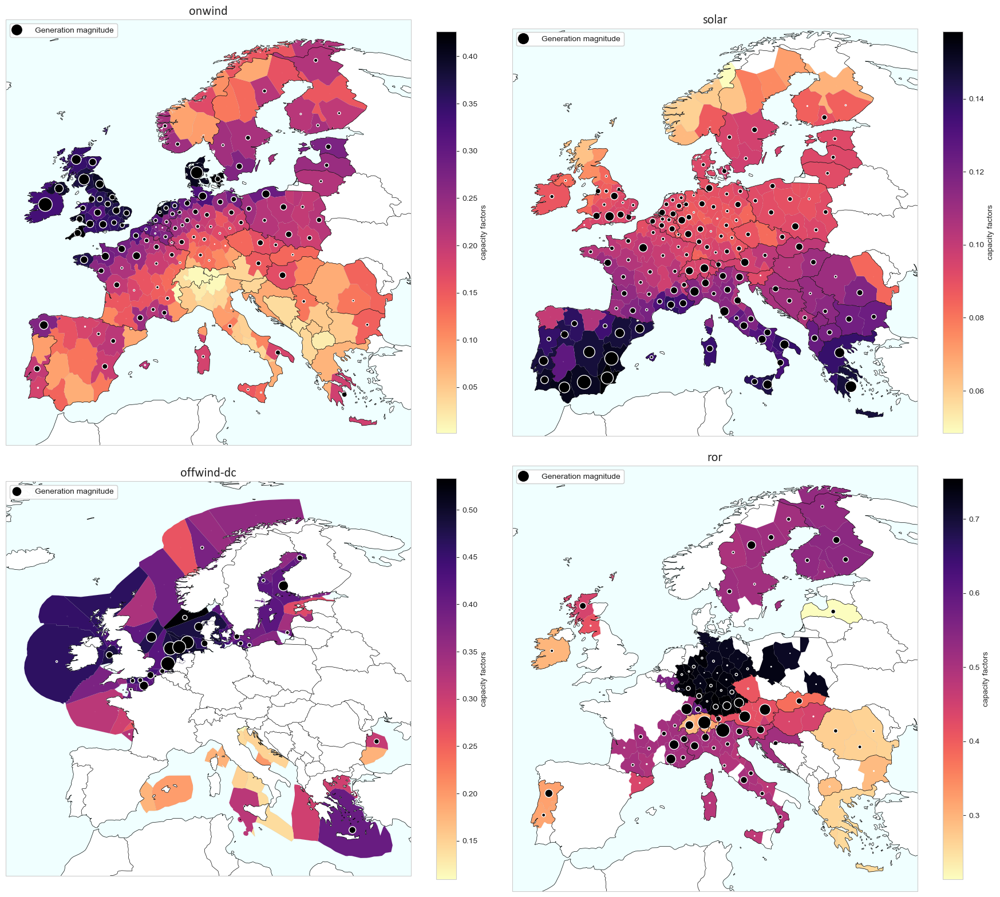

In [44]:
# thesis plot

# capacity factors across regions as map
carriers = ["onwind", "solar","offwind-dc", "ror"]

fig, axs = plt.subplots(ncols=2, nrows=2, subplot_kw={'projection': ccrs.EqualEarth()},
                        figsize=(18, 16))
crs = ccrs.EqualEarth()

for i, ax in enumerate(axs.reshape(-1)):

    if carriers[i] in ["offwind-dc", "offwind-ac"]:
        df = df_no_off
    else:
        df = df_no_ons

    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    ax.coastlines(edgecolor='black', linewidth=0.5)
    ax.set_facecolor('white')
    ax.add_feature(cartopy.feature.OCEAN, color='azure')

    df.to_crs(crs.proj4_init).plot(column=f"{carriers[i]}_cf",
                                                   ax=ax,
                                                   cmap=plt.get_cmap("magma_r"),
                                                   linewidth=0.05,
                                                   edgecolor = 'grey',
                                                   legend=True,
                                                   legend_kwds={'label':"capacity factors",
                            'orientation': "vertical",
                                      'shrink' : 0.9})

    max_size = df[f"{carriers[i]}_gen"].max()
    df.to_crs(crs.proj4_init).centroid.plot(ax=ax, sizes=df[f"{carriers[i]}_gen"] / max_size *300,  color="black", edgecolor="white")
    pypsa.plot.add_legend_circles(ax=ax, sizes=[0.6], labels=["Generation magnitude"], patch_kw={'color': 'black', 'edgecolor': 'white'}, legend_kw={'loc': 'upper left'})

    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)

# fig.suptitle("Spatial Differences in the electricity generation of the VRE technologies (STST)", fontsize=16, **font1)
fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/cap_fac_el_gen_vre_STST.png")

# Backup
#m_no.plot(ax=ax, projection=ccrs.EqualEarth(), bus_colors="black", bus_sizes=df[f"{carriers[i]}_gen"] / max_size, line_widths=0, link_widths=0)

In [45]:
carrier = "ror"
# correlation capacity factors and generation
df_no_ons[f"{carrier}_cf"].corr(df_no_ons[f"{carrier}_gen"])

-0.1961889939457471

In [46]:
# correlation with latitude
latitudes = pd.DataFrame([Point(coords).y for coords in df_no_ons['coords']], index=df_no_ons.index)
df_no_ons[f"{carrier}_cf"].corr(latitudes[0])

0.28699573051012384

In [47]:
df_no_ons[f"{carrier}_gen"].sort_values(ascending=False)

name
IT0 5     3770.167190
CH0 1     3282.660851
AT0 2     2482.317431
AT0 0     2424.595661
FR0 21    2387.047205
             ...     
PT0 2             NaN
RS0 0             NaN
RS0 1             NaN
SE3 3             NaN
SE3 4             NaN
Name: ror_gen, Length: 181, dtype: float64

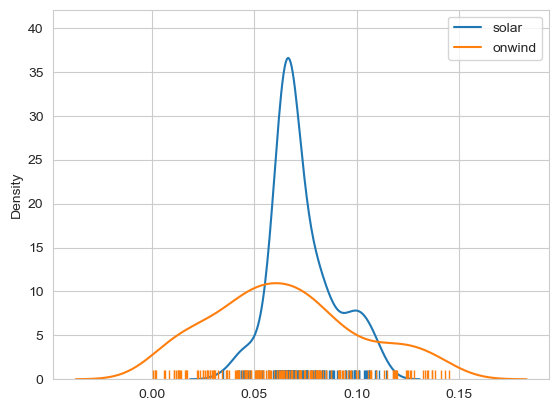

In [48]:
from sklearn import preprocessing

sns.distplot(preprocessing.normalize(df_no_ons["solar_cf"].dropna().values.reshape(1, -1)), hist=False, rug=True, label="solar")
sns.distplot(preprocessing.normalize(df_no_ons["onwind_cf"].dropna().values.reshape(1, -1)), hist=False, rug=True, label="onwind")

plt.legend()
plt.show()

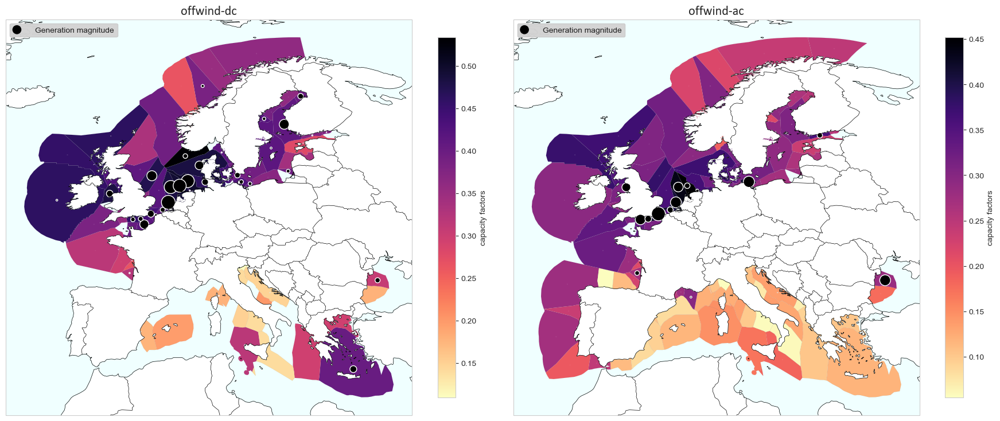

In [49]:
# capacity factors across regions as map
carriers = ["offwind-dc", "offwind-ac"]

fig, axs = plt.subplots(ncols=2, nrows=1, subplot_kw={'projection': ccrs.EqualEarth()},
                        figsize=(18, 16))
crs = ccrs.EqualEarth()

for i, ax in enumerate(axs.reshape(-1)):

    if carriers[i] in ["offwind-dc", "offwind-ac"]:
        df = df_no_off
    else:
        df = df_no_ons

    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    ax.coastlines(edgecolor='black', linewidth=0.5)
    ax.set_facecolor('white')
    ax.add_feature(cartopy.feature.OCEAN, color='azure')

    df.to_crs(crs.proj4_init).plot(column=f"{carriers[i]}_cf",
                                                   ax=ax,
                                                   cmap=plt.get_cmap("magma_r"),
                                                   linewidth=0.05,
                                                   edgecolor = 'grey',
                                                   legend=True,
                                                   legend_kwds={'label':"capacity factors",
                            'orientation': "vertical",
                                      'shrink' : 0.4})

    max_size = df[f"{carriers[i]}_gen"].max()
    df.to_crs(crs.proj4_init).centroid.plot(ax=ax, sizes=df[f"{carriers[i]}_gen"] / max_size *300,  color="black", edgecolor="white")
    pypsa.plot.add_legend_circles(ax=ax, sizes=[0.6], labels=["Generation magnitude"], patch_kw={'color': 'black', 'edgecolor': 'white'}, legend_kw={'loc': 'upper left', 'facecolor': 'lightgrey'})

    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)
fig.tight_layout()
plt.show()

# Backup
#m_no.plot(ax=ax, projection=ccrs.EqualEarth(), bus_colors="black", bus_sizes=df[f"{carriers[i]}_gen"] / max_size, line_widths=0, link_widths=0)

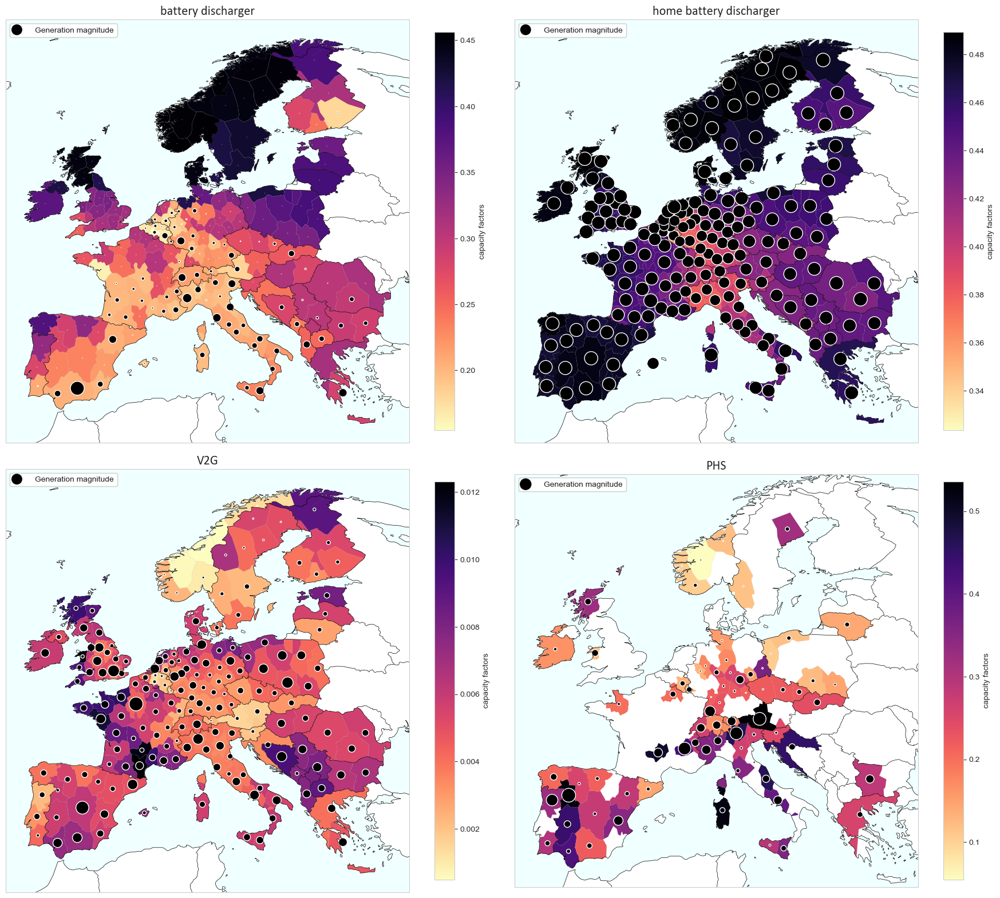

In [50]:
#

# capacity factors across regions as map
carriers = ["battery discharger", "home battery discharger", "V2G", "PHS"]

fig, axs = plt.subplots(ncols=2, nrows=2, subplot_kw={'projection': ccrs.EqualEarth()},
                        figsize=(18, 16))
crs = ccrs.EqualEarth()

for i, ax in enumerate(axs.reshape(-1)):

    if carriers[i] in ["offwind-dc", "offwind-ac"]:
        df = df_no_off
    else:
        df = df_no_ons

    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
    ax.coastlines(edgecolor='black', linewidth=0.5)
    ax.set_facecolor('white')
    ax.add_feature(cartopy.feature.OCEAN, color='azure')

    df.to_crs(crs.proj4_init).plot(column=f"{carriers[i]}_cf",
                                                   ax=ax,
                                                   cmap=plt.get_cmap("magma_r"),
                                                   linewidth=0.05,
                                                   edgecolor = 'grey',
                                                   legend=True,
                                                   legend_kwds={'label':"capacity factors",
                            'orientation': "vertical",
                                      'shrink' : 0.9})

    max_size = df[f"{carriers[i]}_gen"].max()
    df.to_crs(crs.proj4_init).centroid.plot(ax=ax, sizes=df[f"{carriers[i]}_gen"] / max_size *300,  color="black", edgecolor="white")
    pypsa.plot.add_legend_circles(ax=ax, sizes=[0.6], labels=["Generation magnitude"], patch_kw={'color': 'black', 'edgecolor': 'white'}, legend_kw={'loc': 'upper left'})

    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)

# fig.suptitle("Spatial Differences in the electricity generation of the VRE technologies (STST)", fontsize=16, **font1)
fig.tight_layout()
plt.show()

# fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/cap_fac_el_gen_store_STST.png")

# Backup
#m_no.plot(ax=ax, projection=ccrs.EqualEarth(), bus_colors="black", bus_sizes=df[f"{carriers[i]}_gen"] / max_size, line_widths=0, link_widths=0)

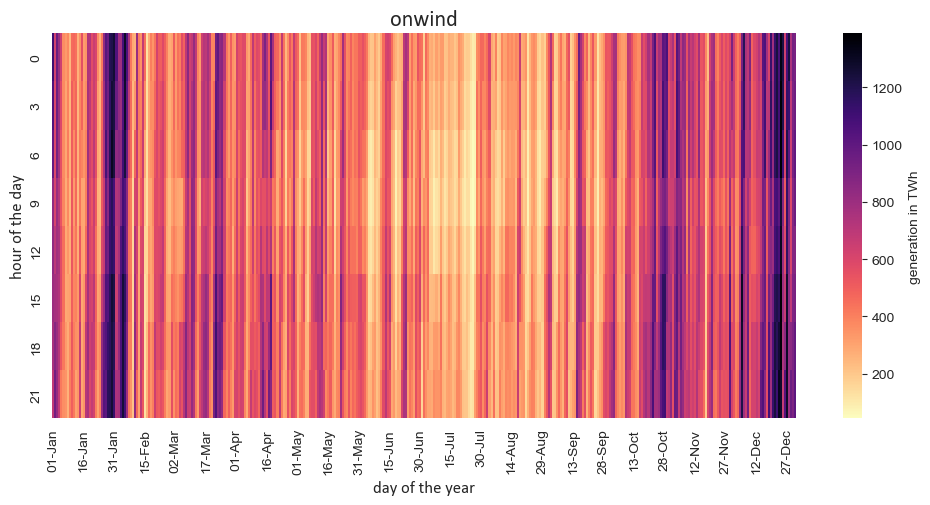

In [51]:
# generation through time as heatmap

carrier = "onwind"

# get generation in TWh
df = pd.DataFrame(n.generators_t.p.loc[:, n.generators.carrier == carrier].sum(axis=1)) / 1000

hours = df.index.hour.unique()
df_start = pd.DataFrame(index=pd.Index(df.index.date).unique())

for hour in hours:
    df_start[str(hour)] = df[df.index.hour==hour].values

plt.figure(figsize=(12, 5))
ax = sns.heatmap(df_start.transpose(),
                 cmap=plt.get_cmap("magma_r"),
                 linewidth=0.001,
                 xticklabels=15,
                 cbar_kws={'label': 'generation in TWh'})

plt.title(f"{carrier}", fontsize=16, **font1)
plt.ylabel("hour of the day", fontsize=12, **font1)
plt.xlabel("day of the year", fontsize=12, **font1)

# Rewrite the y labels
x_labels = ax.get_xticks()
ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%d-%b'))

plt.show()

In [52]:
#TODO: you could calc capacity factors for every time step and also plot them as heatmap

### Full load hours

In [53]:
# how are the full load hours aggregated:
# sum over the flh in every region adn time step (sumover time) -> you recieve flh for every region over the time

th = 0.9
n = n_no
df = df_no_ons

# get full_load hours (generators)
for carrier in n.generators.carrier.unique():
    gen = n.generators_t.p[n.generators[n.generators.carrier == carrier].index]
    # max_output = n.generators.p_nom_opt[n.generators.carrier == carrier]
    max_output = gen.max()

    # ts with max_output
    max_output_ts = gen.copy()
    for snap in n.storage_units_t.p.index:
        max_output_ts.loc[snap] = max_output[max_output_ts.columns]

    # calc full load hours
    flh = (gen >= th * max_output_ts).sum()
    flh.index = flh.index.map(n.generators.bus).map(n.buses.location)
    df[f"{carrier}_flh"] = flh

# links
for carrier in n.links.carrier.unique():
    gen = abs(n.links_t.p1.loc[:, n.links.carrier == carrier])
    # use p_nom_opt as indicator for full load hour
    # max_output = n.links.p_nom_opt[n.links.carrier == carrier]
    # use maximum of generation output as indicator for full load hour
    max_output = gen.max()

    # ts with p_nom_opt
    max_output_ts = gen.copy()
    for snap in n.storage_units_t.p.index:
        max_output_ts.loc[snap] = max_output[max_output_ts.columns]

    # calc full load hours
    flh = (gen >= th * max_output_ts).sum()
    flh.index = flh.index.map(n.links.bus1).map(n.buses.location)
    # group duplicate index entries
    flh = flh.groupby(by=["Link"], axis="index").sum()
    df[f"{carrier}_flh"] = flh

# storage units
for carrier in n.storage_units.carrier.unique():
    gen = n.storage_units_t.p_dispatch.loc[:, n.storage_units.carrier == carrier]
    max_output = gen.max()

    max_output_ts = gen.copy()
    for snap in n.storage_units_t.p.index:
        max_output_ts.loc[snap] = max_output[max_output_ts.columns]

    # calc full load hours
    flh = (gen >= th * max_output_ts).sum()
    flh.index = flh.index.map(n.storage_units.bus).map(n.buses.location)
    df[f"{carrier}_flh"] = flh

df.head(3)

,geometry,coords,name,offwind-ac_mv,offwind-ac_gen,offwind-ac_cf,onwind_mv,onwind_gen,onwind_cf,solar_mv,...,H2 liquefaction_flh,Fischer-Tropsch_flh,process emissions_flh,process emissions CC_flh,DAC_flh,electricity distribution grid_flh,home battery charger_flh,home battery discharger_flh,hydro_flh,PHS_flh
name,,,,,,,,,,,,,,,,,,,,,
AL0 0,"POLYGON ((20.32207 39.91318, 20.39703 39.81809...","(20.00648437943388, 41.14563914300007)",AL0 0,126.148417,0.009746,0.090705,NaN,0.005042,0.038018,44.628736,...,2920,NaN,NaN,NaN,NaN,612,8,1,NaN,NaN
AT0 0,"POLYGON ((16.45660 47.41184, 16.43396 47.39685...","(15.700718667666258, 47.896990619088925)",AT0 0,NaN,NaN,NaN,83.457109,10131.968084,0.149667,54.679083,...,2920,NaN,NaN,NaN,NaN,872,33,5,1084.0,NaN
AT0 1,"POLYGON ((10.08288 47.35907, 10.20928 47.37248...","(10.379200993764837, 47.18231496200006)",AT0 1,NaN,NaN,NaN,NaN,0.000116,0.004685,65.745903,...,2920,NaN,NaN,NaN,NaN,1104,161,1,1079.0,76.0


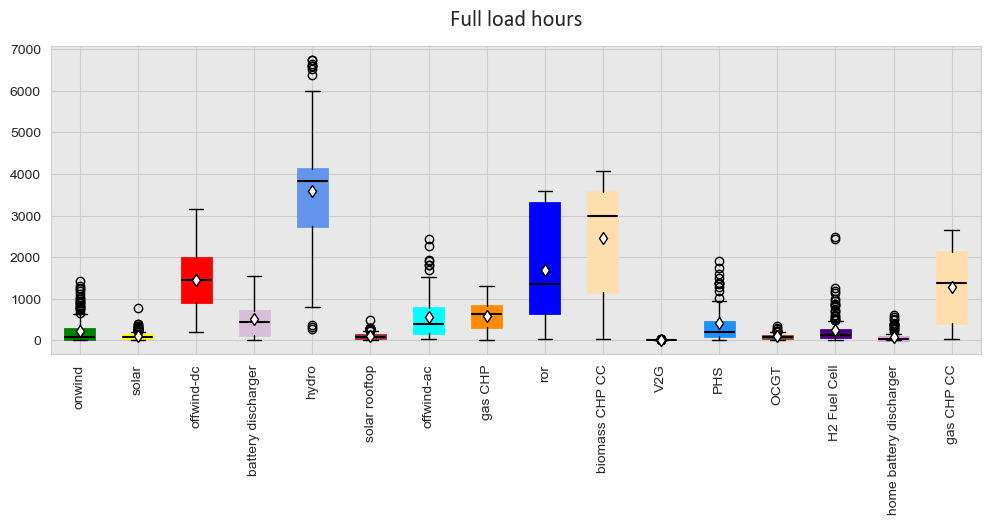

In [54]:
# full load hours
boxprops=dict(facecolor="white", color="white")
medianprops = dict(color="black",linewidth=1.5)
meanprops = {"marker":"d","markerfacecolor":"white", "markeredgecolor":"black"}

i_no_gen_rev = [carrier_renaming_reverse.get(n, n) for n in i_no_gen]
# multiply with 3 to account for the 3h resolution
df = df_no_ons[[f"{i}_flh" for i in i_no_gen_rev]]*3
df = df.values

# Filter data using np.isnan
mask = ~np.isnan(df)
filtered_data = [d[m] for d, m in zip(df.T, mask.T)]

fig, ax = plt.subplots(figsize=(12, 4))
bp = plt.boxplot(x=filtered_data, labels =i_no_gen, patch_artist=True, showmeans=True, boxprops=boxprops, meanprops=meanprops, medianprops=medianprops)

for box, col in zip(bp['boxes'],[carrier_colors[c] for c in i_no_gen]):
    # change outline color
    box.set(color=col, linewidth=2)

plt.title("Title")
ax.patch.set_facecolor('lightgrey')
ax.patch.set_alpha(0.5)
plt.xticks(rotation=90)
plt.title("Full load hours", fontsize=16, pad=15,  **font1)
plt.show()

### Utilitization rate

In [55]:
# what you actually want to measure is on how much of possible generation is utilized
# utilitazation rate???
# Problem if you calc the rate for every time step and location independently and then take the mean, all urs have the same weight. That makes no sense, as at times with almost no generation there is numerical issues with the rate
# better calc ur for every region as the ratio of the sum over all gen and the sum over all possible gen (make sure only valid regions make it to the plot, e.g. minimun generation of o,2 quantile)

th = 0.01 # MWh
method = 1

# generators
max_out_gen = n.generators_t.p_max_pu * n.generators.p_nom_opt[n.generators_t.p_max_pu.columns]
real_out_gen = n.generators_t.p[n.generators_t.p_max_pu.columns]
out_ratio_gen = (real_out_gen / max_out_gen) [real_out_gen > th]
out_ratio_gen_sum = real_out_gen.sum() / max_out_gen.sum()

# links
# gen
n_links_p1 = n.links_t.p1 *-1
# some links have a static p_max_pu value and some have an alternating (series)
index_series_li = n.links_t.p_max_pu.columns
index_static_li = n.links.index.difference(n.links_t.p_max_pu.columns)

# calculate the possible output for the link for every time step
if method == 1:
    # use p_max_pu * p_nom_op
    max_output_links_static = n.links.loc[index_static_li].p_max_pu * n.links.loc[index_static_li].p_nom_opt
elif method == 2:
    # alternatively use the maximum of the real output and set it as the maximum capacity
    max_output_links_static= n_links_p1[index_static_li].max()

# make ts of max_output_links_static
max_output_links_ts_static = n.links_t.p0[index_static_li].copy()
for snap in n.links_t.p0.index:
    max_output_links_ts_static.loc[snap] = max_output_links_static[index_static_li]

# calc time series of time dependent p_max_pu links
max_output_links_ts_series = n.links_t.p_max_pu * n.links.p_nom_opt[index_series_li]

# merge static and series values and reorder columns
max_output_links_ts = pd.concat([max_output_links_ts_static, max_output_links_ts_series], axis=1)[n.links_t.p0.columns]

# compare to real output
out_ratio_links = (n_links_p1 / max_output_links_ts) [n_links_p1 > th]
# calc out ratio weighted by generation (sum of all gen / sum of all cap / max_output)
out_ratio_links_sum = n_links_p1.sum() / max_output_links_ts.sum()

# storage units
max_output = n.storage_units.p_max_pu * n.storage_units.p_nom_opt
max_output_ts_su = n.storage_units_t.p.copy()
for snap in n.storage_units_t.p.index:
    max_output_ts_su.loc[snap] = max_output[n.storage_units_t.p.columns]
# compare to real output
out_ratio_su = (n.storage_units_t.p_dispatch / max_output_ts_su) [n.storage_units_t.p_dispatch > th]
out_ratio_su_sum = n.storage_units_t.p_dispatch.sum() / max_output_ts_su.sum()

In [56]:
n.storage_units_t.p_dispatch.sum()

StorageUnit
AT0 0 hydro    3.494307e+05
AT0 1 PHS      5.552656e+05
AT0 1 hydro    1.574122e+06
AT0 2 PHS      1.226809e+06
AT0 2 hydro    4.952162e+06
                   ...     
SE3 7 hydro    2.697252e+06
SI0 0 PHS      5.884710e+04
SI0 0 hydro    8.707775e+05
SK0 0 PHS      3.104414e+05
SK0 0 hydro    7.956810e+05
Length: 170, dtype: float64

In [57]:
max_output_ts_su.sum()

StorageUnit
AT0 0 hydro    9.110400e+05
AT0 1 PHS      7.043040e+06
AT0 1 hydro    4.104014e+06
AT0 2 PHS      5.341556e+06
AT0 2 hydro    1.291113e+07
                   ...     
SE3 7 hydro    5.783213e+06
SI0 0 PHS      5.402000e+05
SI0 0 hydro    2.133907e+06
SK0 0 PHS      2.982138e+06
SK0 0 hydro    2.312640e+06
Length: 170, dtype: float64

In [58]:
th_p = 0.01 # share of mean generation
n = n_no
df = df_no_ons

# how much of the whole possible energy that can be generated is utilized (sum over all time steps and location than take ratio)
overall_ur = pd.DataFrame(index=range(1))

# gens
for carrier in n.generators.carrier.unique():
    if carrier in ['gas', 'oil']:
        continue
    # calc ur as mean of all urs per time and space
    index = n.generators[n.generators.carrier == carrier].index
    ur = out_ratio_gen[index].mean()
    ur.index = ur.index.map(n.generators.bus).map(n.buses.location)
    df[f"{carrier}_ur_mean"] = ur

    # calc ur as ratio of sum of all gen and sum of all output
    ur_s = out_ratio_gen_sum[index][real_out_gen[index].sum() > real_out_gen[index].sum().mean() * th_p]
    ur_s.index = ur_s.index.map(n.generators.bus).map(n.buses.location)
    df[f"{carrier}_ur"] = ur_s

    # overall ur
    overall_ur[f"{carrier}"] = real_out_gen[index].sum().sum() / max_out_gen[index].sum().sum()

# links
for carrier in n.links.carrier.unique():
    # calc
    index = n.links[n.links.carrier == carrier].index
    ur = out_ratio_links[index].mean()
    ur.index = ur.index.map(n.links.bus1).map(n.buses.location)
    # group duplicate index entries
    ur = ur.groupby(by=["Link"], axis="index").mean()
    df[f"{carrier}_ur_mean"] = ur

    # calc ur as ratio of sum of all gen and sum of all output
    ur_s = out_ratio_links_sum[index][n_links_p1[index].sum() > n_links_p1[index].sum().mean() * th_p]
    ur_s.index = ur_s.index.map(n.links.bus1).map(n.buses.location)
    # group duplicate index entries
    ur_s = ur_s.groupby(by=["Link"], axis="index").mean()
    df[f"{carrier}_ur"] = ur_s

    # overall ur
    overall_ur[f"{carrier}"] = n_links_p1[index].sum().sum() / max_output_links_ts[index].sum().sum()

# storage units
for carrier in n.storage_units.carrier.unique():
    # calc
    index = n.storage_units[n.storage_units.carrier == carrier].index
    ur = out_ratio_su[index].mean()
    ur.index = ur.index.map(n.storage_units.bus).map(n.buses.location)
    df[f"{carrier}_ur_mean"] = ur

    #
    ur_s = out_ratio_su_sum[index][n.storage_units_t.p_dispatch[index].sum() > n.storage_units_t.p_dispatch[index].sum().mean() * th_p]
    ur_s.index = ur_s.index.map(n.storage_units.bus).map(n.buses.location)
    df[f"{carrier}_ur"] = ur_s

    # overall ur
    overall_ur[f"{carrier}"] = n.storage_units_t.p_dispatch[index].sum().sum() / max_output_ts_su[index].sum().sum()

df.head(3)

,geometry,coords,name,offwind-ac_mv,offwind-ac_gen,offwind-ac_cf,onwind_mv,onwind_gen,onwind_cf,solar_mv,...,electricity distribution grid_ur_mean,electricity distribution grid_ur,home battery charger_ur_mean,home battery charger_ur,home battery discharger_ur_mean,home battery discharger_ur,hydro_ur_mean,hydro_ur,PHS_ur_mean,PHS_ur
name,,,,,,,,,,,,,,,,,,,,,
AL0 0,"POLYGON ((20.32207 39.91318, 20.39703 39.81809...","(20.00648437943388, 41.14563914300007)",AL0 0,126.148417,0.009746,0.090705,NaN,0.005042,0.038018,44.628736,...,0.563977,0.527220,0.455364,0.454625,0.436440,0.436440,NaN,NaN,NaN,NaN
AT0 0,"POLYGON ((16.45660 47.41184, 16.43396 47.39685...","(15.700718667666258, 47.896990619088925)",AT0 0,NaN,NaN,NaN,83.457109,10131.968084,0.149667,54.679083,...,0.734131,0.734131,0.443735,0.443452,0.425714,0.425714,0.555810,0.383551,NaN,NaN
AT0 1,"POLYGON ((10.08288 47.35907, 10.20928 47.37248...","(10.379200993764837, 47.18231496200006)",AT0 1,NaN,NaN,NaN,NaN,0.000116,0.004685,65.745903,...,0.769134,0.769134,0.414851,0.413955,0.398248,0.397396,0.561114,0.383557,0.085168,0.078839


In [59]:
out_ratio_su_sum

StorageUnit
AT0 0 hydro    0.383551
AT0 1 PHS      0.078839
AT0 1 hydro    0.383557
AT0 2 PHS      0.229673
AT0 2 hydro    0.383558
                 ...   
SE3 7 hydro    0.466393
SI0 0 PHS      0.108936
SI0 0 hydro    0.408067
SK0 0 PHS      0.104100
SK0 0 hydro    0.344057
Length: 170, dtype: float64

In [60]:
carrier = "hydro"
index = n.storage_units[n.storage_units.carrier == carrier].index
ur_s = out_ratio_su_sum[index][n.storage_units_t.p_dispatch[index].sum() > n.storage_units_t.p_dispatch[index].sum().mean() * th_p]
ur_s.index = ur_s.index.map(n.storage_units.bus).map(n.buses.location)
ur_s

StorageUnit
AT0 0    0.383551
AT0 1    0.383557
AT0 2    0.383558
BE0 1    0.538293
BG0 0    0.275373
           ...   
SE3 5    0.466393
SE3 6    0.466385
SE3 7    0.466393
SI0 0    0.408067
SK0 0    0.344057
Length: 93, dtype: float64

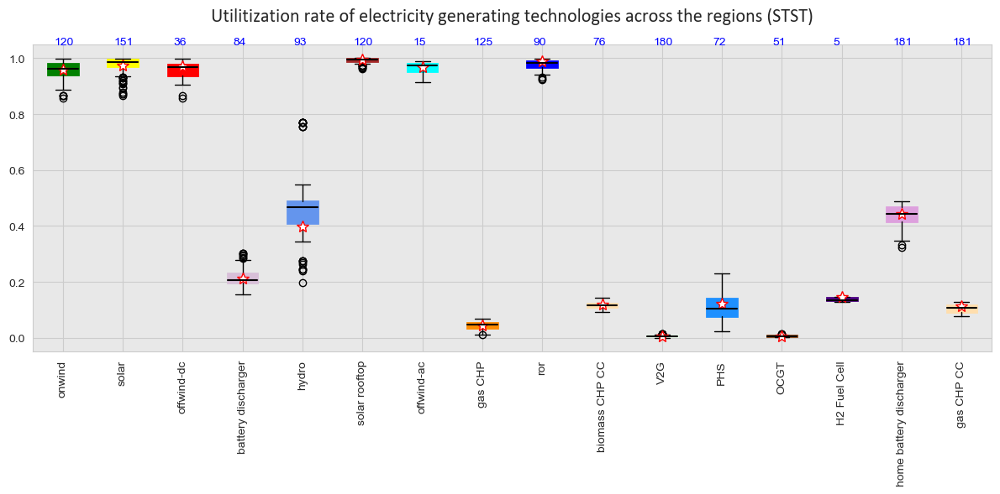

In [61]:
# utilitization rate

boxprops=dict(facecolor="white", color="white")
medianprops = dict(color="black",linewidth=1.5)
meanprops = {"marker":"d","markerfacecolor":"white", "markeredgecolor":"black"}

i_no_gen_rev = [carrier_renaming_reverse.get(n, n) for n in i_no_gen]
df = df_no_ons[[f"{i}_ur" for i in i_no_gen_rev]]
df = df.values

# Filter data using np.isnan
mask = ~np.isnan(df)
filtered_data = [d[m] for d, m in zip(df.T, mask.T)]

fig, ax = plt.subplots(figsize=(12, 6))
bp = plt.boxplot(filtered_data, labels =i_no_gen, patch_artist=True, showmeans=False, boxprops=boxprops, meanprops=meanprops, medianprops=medianprops)

for box, col in zip(bp['boxes'],[carrier_colors[c] for c in i_no_gen]):
    # change outline color
    box.set(color=col, linewidth=2)

plt.title("Title")
ax.patch.set_facecolor('lightgrey')
ax.patch.set_alpha(0.5)
plt.xticks(rotation=90)
plt.title("Utilitization rate of electricity generating technologies across the regions (STST)", fontsize=16, pad=20,  **font1)
ax.plot(np.arange(1,17), overall_ur[i_no_gen_rev].transpose(),"x", marker='*', color="red", markersize= 10, markerfacecolor="white")

for i, sample_size in enumerate(df_no_ons[[f"{i}_ur" for i in i_no_gen_rev]].count()):
    ax.annotate(sample_size, xy=(0,0),  xycoords='axes fraction',
        xytext=((i+0.35)/16,1), textcoords='axes fraction', color="blue")

fig.tight_layout()
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/ur_el_con_STST.png")

# red stars symbolize overall utilization rate
# "home battery discharger" has maximum generation over all snaps and locations of 0.29
# "urban central gas CHP CC" has maximum generation over all snaps and locations of 0.20

In [62]:
overall_ur[i_no_gen_rev]

,onwind,solar,offwind-dc,battery discharger,hydro,solar rooftop,offwind-ac,urban central gas CHP,ror,urban central solid biomass CHP CC,V2G,PHS,OCGT,H2 Fuel Cell,home battery discharger,urban central gas CHP CC
0,0.958492,0.975228,0.970013,0.211346,0.399228,0.994593,0.96945,0.043571,0.990064,0.120139,0.005946,0.122779,0.005699,0.145142,0.441934,0.114358


In [63]:
df_no_ons[[f"{i}_ur" for i in i_no_gen_rev]]["hydro_ur"]

name
AL0 0         NaN
AT0 0    0.383551
AT0 1    0.383557
AT0 2    0.383558
BA0 0         NaN
           ...   
SE3 5    0.466393
SE3 6    0.466385
SE3 7    0.466393
SI0 0    0.408067
SK0 0    0.344057
Name: hydro_ur, Length: 181, dtype: float64

In [64]:
# 1: what does it mean if the star is outside the box / whiskers: star below box (hydro) means that most of the regions are having higher ur than the overall utilitization. The regions with most generation have a lower ur than the average

# 2: what is the difference between the capacity facotr and the utilitization rate for technologies with a constant capacity e.g. gas CHP? Shouldnt this be the same? Because it is not.

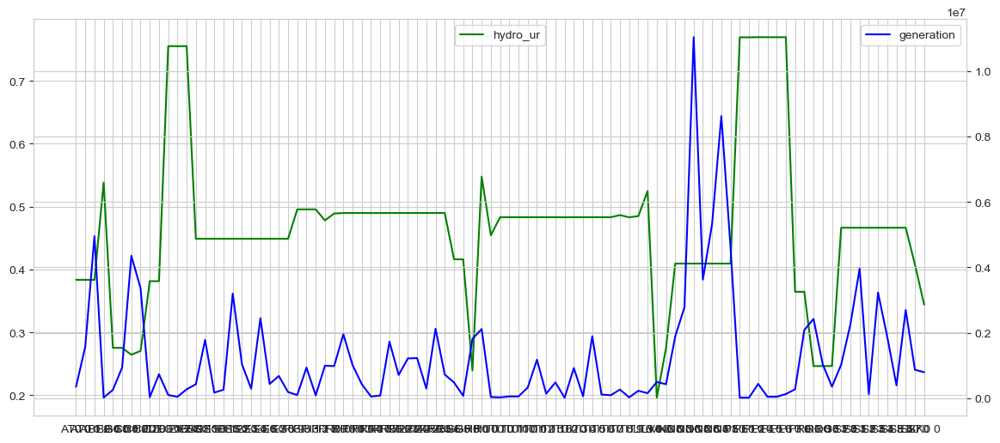

In [65]:
# Further investigation

# storage unit
carrier = "hydro"
df_no_ons[f"{carrier}_ur"]
gen = n.storage_units_t.p_dispatch[n.storage_units[n.storage_units.carrier == carrier].index].sum()
gen.index = gen.index.map(n.storage_units.bus).map(n.buses.location)
gen = gen[df_no_ons[f"{carrier}_ur"].dropna().index]

fig, ax1 = plt.subplots(figsize=(14,6))

ax2 = ax1.twinx()
ax1.plot(df_no_ons[f"{carrier}_ur"].dropna(), 'g-', label=f"{carrier}_ur")
ax2.plot(gen.dropna(), 'b-', label="generation")
ax1.legend(loc="upper center")
ax2.legend()

plt.show()

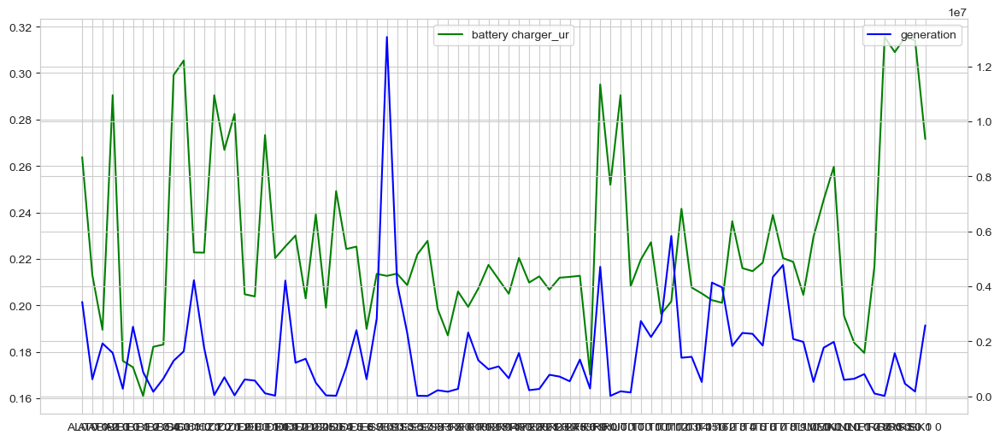

In [66]:
# link
carrier = "battery charger"
df_no_ons[f"{carrier}_ur"]
gen = n_links_p1[n.links[n.links.carrier == carrier].index].sum()
gen.index = gen.index.map(n.links.bus1).map(n.buses.location)
gen = gen[df_no_ons[f"{carrier}_ur"].dropna().index]

fig, ax1 = plt.subplots(figsize=(14,6))

ax2 = ax1.twinx()
ax1.plot(df_no_ons[f"{carrier}_ur"].dropna(), 'g-', label=f"{carrier}_ur")
ax2.plot(gen.dropna(), 'b-', label="generation")
ax1.legend(loc="upper center")
ax2.legend()

plt.show()

In [67]:
gen.sort_values(ascending=False)

name
ES0 11    1.307405e+07
IT0 12    5.830100e+06
IT0 8     4.772471e+06
GR0 0     4.707927e+06
IT0 7     4.334124e+06
              ...     
DE0 4     1.631580e+04
ES0 7     1.499343e+04
HR0 0     1.154680e+04
RO0 0     1.012070e+04
ES0 8     7.654843e+03
Length: 84, dtype: float64

In [68]:
df_no_ons[f"{carrier}_ur"].loc[gen.sort_values(ascending=False).index]

name
ES0 11    0.212707
IT0 12    0.201722
IT0 8     0.220336
GR0 0     0.295130
IT0 7     0.239004
            ...   
DE0 4     0.249226
ES0 7     0.221970
HR0 0     0.251922
RO0 0     0.315529
ES0 8     0.227769
Name: battery charger_ur, Length: 84, dtype: float64

In [69]:
# Norway indices
no_i = gen.index[gen.index.str.contains('NO')]

In [70]:
df_no_ons[f"{carrier}_ur"][no_i]#.mean()
# why are all the value for norway the same??

Series([], Name: battery charger_ur, dtype: float64)

In [71]:
gen[no_i].sum() / gen.sum()

0.0

### Generation profiles

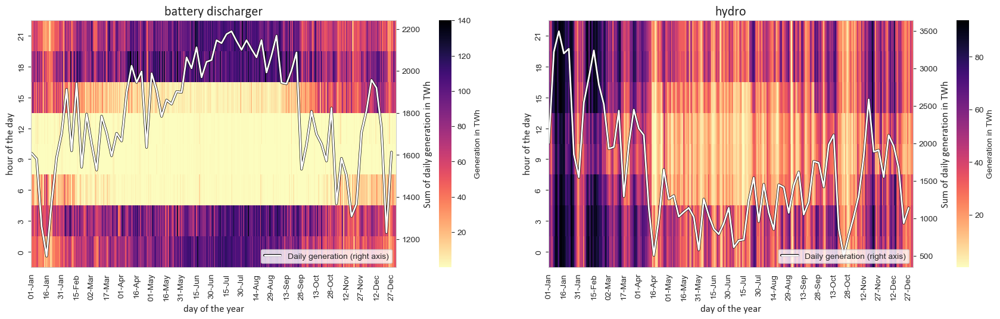

In [72]:
# generators, links, and storage units
carriers = ["battery discharger", "hydro"]
n = n_no

fig, axs = plt.subplots(nrows=1,ncols=2, figsize=(18, 6))

for i, ax in enumerate(axs):

    if carriers[i] in n.generators.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.generators_t.p.loc[:, n.generators.carrier == carriers[i]].sum(axis=1)) / 1000

    elif carriers[i] in n.links.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.links_t.p0.loc[:, n.links.carrier == carriers[i]].sum(axis=1)) / 1000

    elif carriers[i] in n.storage_units.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.storage_units_t.p_dispatch.loc[:, n.storage_units.carrier == carriers[i]].sum(axis=1)) / 1000

    hours = df.index.hour.unique()[::-1]
    df_start = pd.DataFrame(index=pd.Index(df.index.date).unique())

    for hour in hours:
        df_start[str(hour)] = df[df.index.hour==hour].values

    sns.heatmap(df_start.transpose(),
                ax=ax,
                cmap=plt.get_cmap("magma_r"),
                linewidth=0.001,
                xticklabels=15,
                cbar_kws={'label': 'Generation in TWh', 'pad': 0.09}
                )


    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)
    ax.set_ylabel("hour of the day", fontsize=12, **font1)
    ax.set_xlabel("day of the year", fontsize=12, **font1)
    #plt.colorbar(im,fraction=0.046, pad=0.04)

    # Rewrite the y labels
    ax_labels = ax.get_xticks()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%d-%b'))

    # Plot generation profile on second y-axis
    # resample and transform axis of date to index (heatmap works not with dates)
    df2 = df.resample("5D").sum()
    df2 = df2[df2.index.year == 2013]
    df2.index = df2.index.dayofyear - 0.5

    ax2 = ax.twinx()
    ax2.plot(df2, color="white", lw=2, path_effects=[pe.Stroke(linewidth=3, foreground='black'), pe.Normal()])
    ax2.legend( loc='lower right', labels=['Daily generation (right axis)'])
    ax2.set_ylabel("Sum of daily generation in TWh", fontsize=12, **font1)
    ax2.grid(False)

fig.tight_layout(pad=3)
plt.show()

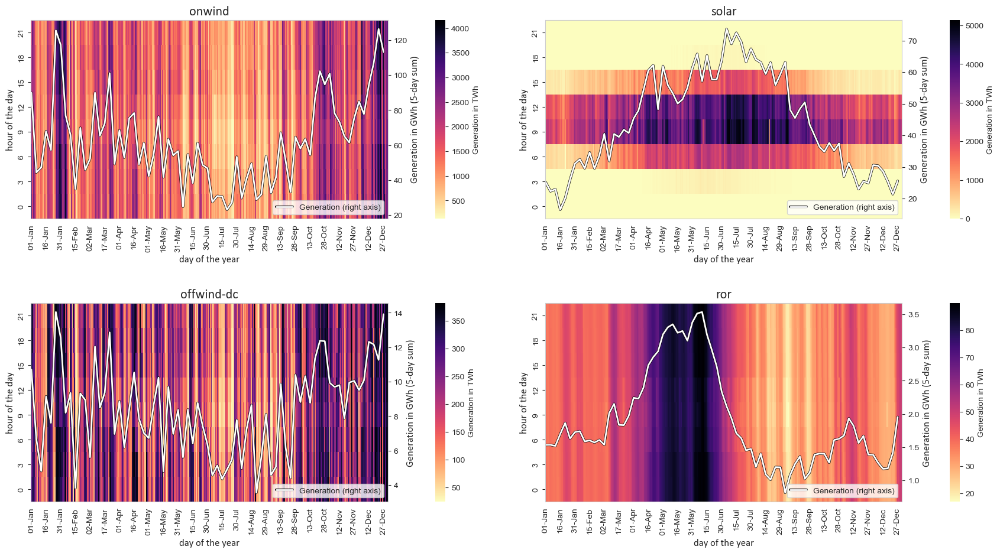

In [73]:
# thesis plot

# generators, links, and storage units
carriers = ["onwind", "solar", "offwind-dc", "ror"]
n = n_no

fig, axs = plt.subplots(nrows=2,ncols=2, figsize=(18, 10))

for i, ax in enumerate(axs.reshape(-1)):

    if carriers[i] in n.generators.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.generators_t.p.loc[:, n.generators.carrier == carriers[i]].sum(axis=1)) / 1000 * 3

    elif carriers[i] in n.links.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.links_t.p0.loc[:, n.links.carrier == carriers[i]].sum(axis=1)) / 1000 * 3

    elif carriers[i] in n.storage_units.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.storage_units_t.p_dispatch.loc[:, n.storage_units.carrier == carriers[i]].sum(axis=1)) / 1000 * 3


    hours = df.index.hour.unique()[::-1]
    df_start = pd.DataFrame(index=pd.Index(df.index.date).unique())

    for hour in hours:
        df_start[str(hour)] = df[df.index.hour==hour].values

    sns.heatmap(df_start.transpose(),
                ax=ax,
                cmap=plt.get_cmap("magma_r"),
                linewidth=0.001,
                xticklabels=15,
                cbar_kws={'label': 'Generation in TWh', 'pad': 0.1})

    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)
    ax.set_ylabel("hour of the day", fontsize=12, **font1)
    ax.set_xlabel("day of the year", fontsize=12, **font1)

    # Rewrite the y labels
    x_labels = ax.get_xticks()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%d-%b'))

    # Plot generation profile on second y-axis
    # resample and transform axis of date to index (heatmap works not with dates)
    df2 = df.resample("5D").sum() / 1000
    df2 = df2[df2.index.year == 2013]
    df2.index = df2.index.dayofyear - 0.5

    ax2 = ax.twinx()
    ax2.plot(df2, color="white", lw=2, path_effects=[pe.Stroke(linewidth=3, foreground='black'), pe.Normal()])
    ax2.legend( loc='lower right', labels=['Generation (right axis)'])
    ax2.set_ylabel("Generation in GWh (5-day sum)", fontsize=12, **font1)
    ax2.grid(False)

fig.tight_layout(pad=3)
plt.show()

fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_gen_profile_vre_STST.png")

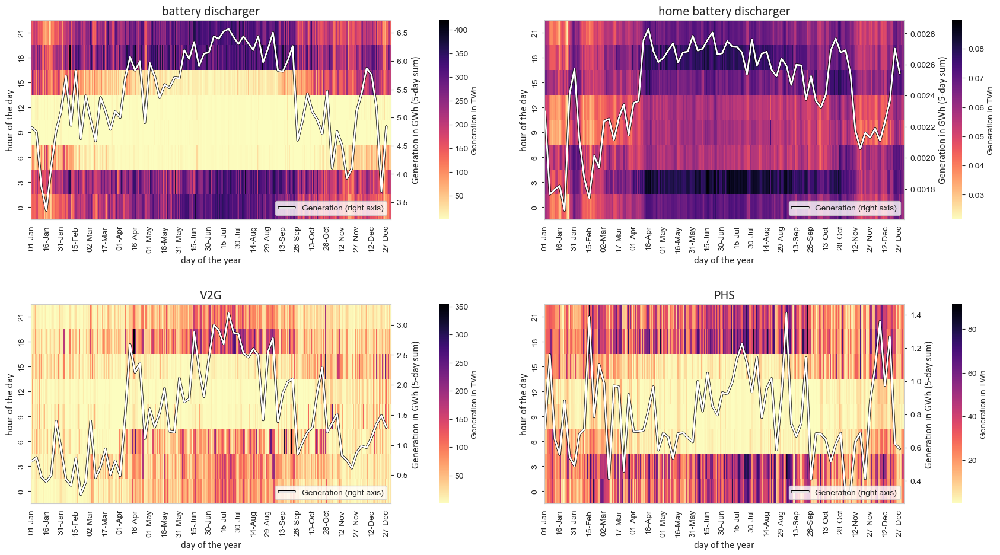

In [74]:
# thesis plot

# generators, links, and storage units
carriers = ["battery discharger", "home battery discharger", "V2G", "PHS"]
n = n_no

fig, axs = plt.subplots(nrows=2,ncols=2, figsize=(18, 10))

for i, ax in enumerate(axs.reshape(-1)):

    if carriers[i] in n.generators.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.generators_t.p.loc[:, n.generators.carrier == carriers[i]].sum(axis=1)) / 1000 * 3

    elif carriers[i] in n.links.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.links_t.p0.loc[:, n.links.carrier == carriers[i]].sum(axis=1)) / 1000 * 3

    elif carriers[i] in n.storage_units.carrier.unique().tolist():
        # get generation in TWh
        df = pd.DataFrame(n.storage_units_t.p_dispatch.loc[:, n.storage_units.carrier == carriers[i]].sum(axis=1)) / 1000 * 3


    hours = df.index.hour.unique()[::-1]
    df_start = pd.DataFrame(index=pd.Index(df.index.date).unique())

    for hour in hours:
        df_start[str(hour)] = df[df.index.hour==hour].values

    sns.heatmap(df_start.transpose(),
                ax=ax,
                cmap=plt.get_cmap("magma_r"),
                linewidth=0.001,
                xticklabels=15,
                cbar_kws={'label': 'Generation in TWh', 'pad': 0.1})

    ax.set_title(f"{carriers[i]}", fontsize=16, **font1)
    ax.set_ylabel("hour of the day", fontsize=12, **font1)
    ax.set_xlabel("day of the year", fontsize=12, **font1)

    # Rewrite the y labels
    x_labels = ax.get_xticks()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%d-%b'))

    # Plot generation profile on second y-axis
    # resample and transform axis of date to index (heatmap works not with dates)
    df2 = df.resample("5D").sum() / 1000
    df2 = df2[df2.index.year == 2013]
    df2.index = df2.index.dayofyear - 0.5

    ax2 = ax.twinx()
    ax2.plot(df2, color="white", lw=2, path_effects=[pe.Stroke(linewidth=3, foreground='black'), pe.Normal()])
    ax2.legend( loc='lower right', labels=['Generation (right axis)'])
    ax2.set_ylabel("Generation in GWh (5-day sum)", fontsize=12, **font1)
    ax2.grid(False)

fig.tight_layout(pad=3)
plt.show()

# fig.savefig(f"{PLOT_DIR}01_general/4.2_systems_technologies/el_gen_profile_store_STST.png")

### Storage
How long is one unit on average stored?

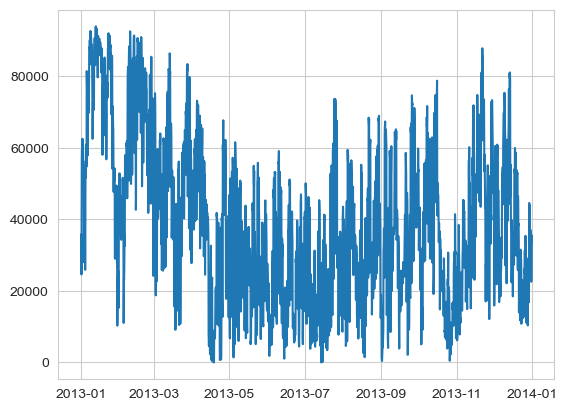

In [75]:
### hydro generation
plt.plot(n.storage_units_t.p_dispatch.loc[:, n.storage_units.carrier == "hydro"].sum(axis=1))

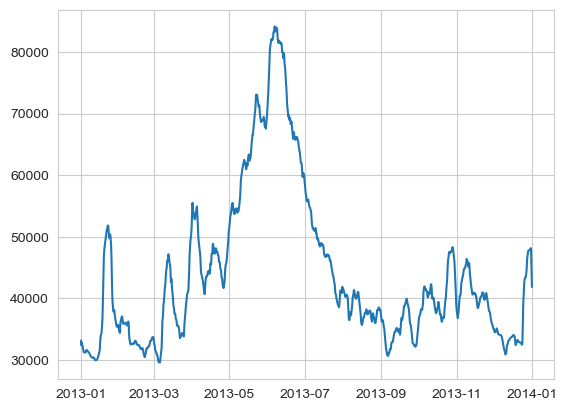

In [76]:
### hydro water availability
plt.plot(n.storage_units_t.inflow.loc[:, n.storage_units.carrier == "hydro"].sum(axis=1))

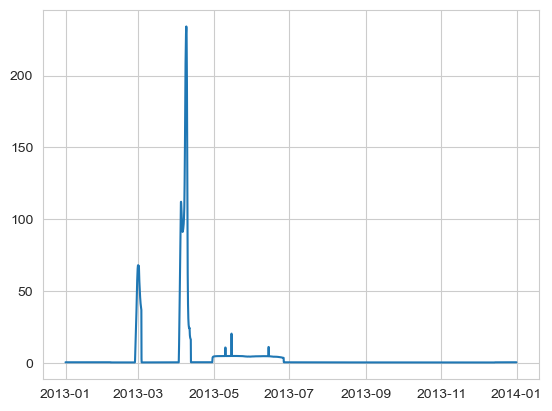

In [77]:
### hydro water availability
plt.plot(n.storage_units_t.spill.loc[:, n.storage_units.carrier == "hydro"].sum(axis=1))

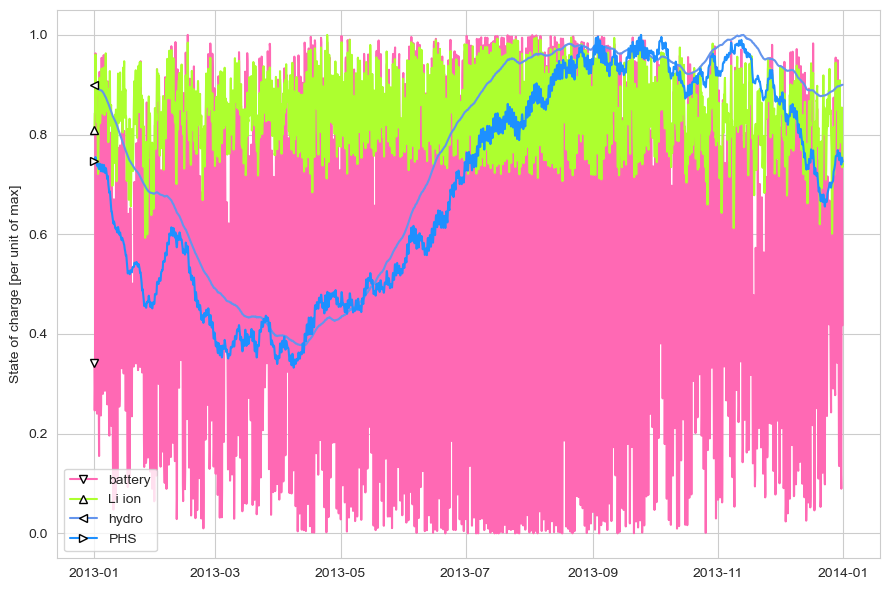

In [127]:
# State of charge [per unit of max] (all stores and storage units)

carriers = ["battery", "Li ion", "hydro", "PHS",]
n = n_no

fig = plt.figure(figsize=(9,6))

for i, c in enumerate(carriers):
    if c in n.storage_units.carrier.unique().tolist():
        # state of charge (sum over locations: 2920 values)
        charge = n.storage_units_t.state_of_charge.loc[:, n.storage_units.carrier == c].sum(axis=1)

    elif c in n.stores.carrier.unique().tolist():
        # state of charge (sum over locations: 2920 values)
        charge = n.stores_t.e.loc[:, n.stores.carrier == c].sum(axis=1)

    plt.plot(charge/charge.max(), label=c, color=carrier_colors[c], marker=markers[i], markevery=[0], mfc='white', mec='black')

plt.ylabel("State of charge [per unit of max]")
plt.legend()
plt.tight_layout()
plt.show()

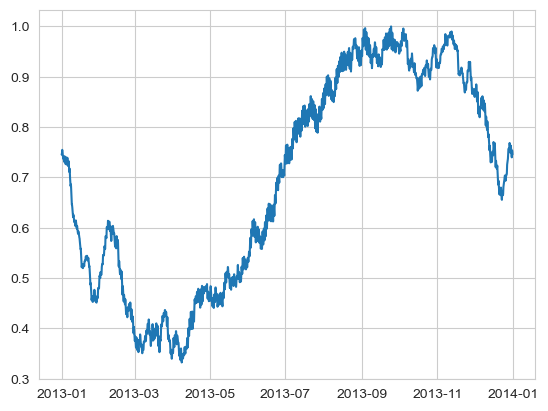

In [106]:
# State of charge [per unit of max]

carrier = "H2"

# state of charge (sum over locations: 2920 values)
charge = n.stores_t.e.loc[:, n.stores.carrier == carrier].sum(axis=1)



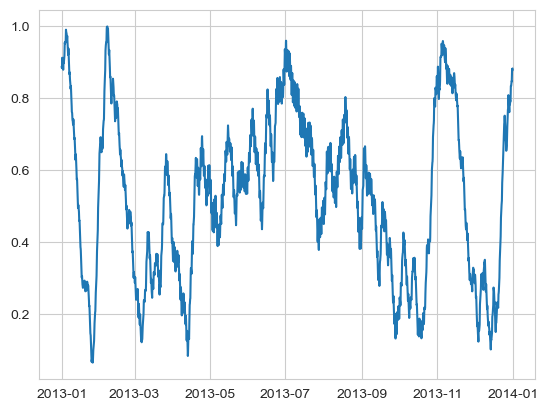

In [107]:
plt.plot(charge/charge.max())